In [40]:
# !pip install skimpy  tensorflow  imblearn 

In [1]:
# !pip install shap

In [2]:
from imblearn.over_sampling import SMOTE

In [3]:
# plot the line plot to show the missing values
# importing necessary libraries 
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [4]:
df = pd.read_csv("data.csv")

In [5]:
## head -- used to first 5 rows
df.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,condition
0,69,1,0,160,234,1,2,131,0,0.1,1,1,0,0
1,69,0,0,140,239,0,0,151,0,1.8,0,2,0,0
2,66,0,0,150,226,0,0,114,0,2.6,2,0,0,0
3,65,1,0,138,282,1,2,174,0,1.4,1,1,0,1
4,64,1,0,110,211,0,2,144,1,1.8,1,0,0,0


In [6]:
## tail -- used to last 5 rows
df.tail()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,condition
1292,43,1,3,150,247,0,0,171,0,1.5,0,0,0,0
1293,43,1,2,130,315,0,0,162,0,1.9,0,1,0,0
1294,45,1,0,110,264,0,0,132,0,1.2,1,0,2,1
1295,51,1,0,125,213,0,2,125,1,1.4,0,1,0,0
1296,52,1,3,108,233,1,0,147,0,0.1,0,3,2,0


In [7]:
# displaying dataset columns of the dataset
df.columns

Index(['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach',
       'exang', 'oldpeak', 'slope', 'ca', 'thal', 'condition'],
      dtype='object')

In [8]:
# displaying shape of the dataset
df.shape

(1297, 14)

In [9]:
# checking of null values 
df.isnull().sum()

age          0
sex          0
cp           0
trestbps     0
chol         0
fbs          0
restecg      0
thalach      0
exang        0
oldpeak      0
slope        0
ca           0
thal         0
condition    0
dtype: int64

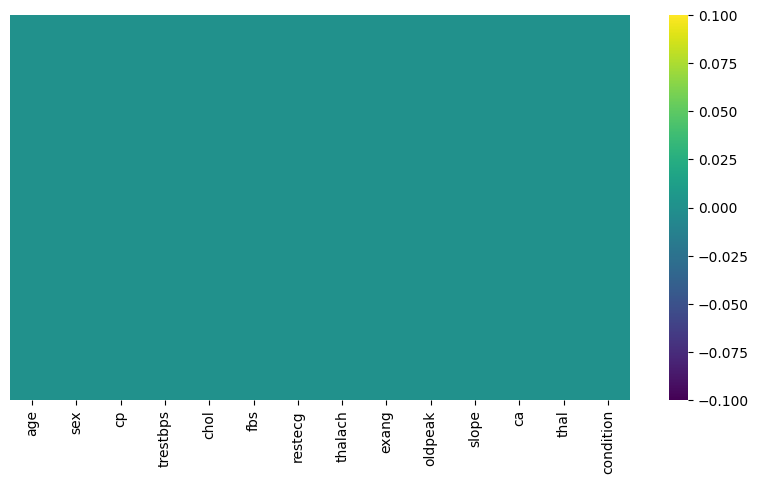

In [10]:
# plot the line plot to show the missing values
# importing necessary libraries 
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

plt.figure(figsize=(10,5))
sns.heatmap(df.isnull(),yticklabels=False,cbar=True,cmap='viridis')
plt.show()

In [11]:
# checking the datatypes of the columns
df.dtypes

age            int64
sex            int64
cp             int64
trestbps       int64
chol           int64
fbs            int64
restecg        int64
thalach        int64
exang          int64
oldpeak      float64
slope          int64
ca             int64
thal           int64
condition      int64
dtype: object

In [12]:
# checking the information of the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1297 entries, 0 to 1296
Data columns (total 14 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   age        1297 non-null   int64  
 1   sex        1297 non-null   int64  
 2   cp         1297 non-null   int64  
 3   trestbps   1297 non-null   int64  
 4   chol       1297 non-null   int64  
 5   fbs        1297 non-null   int64  
 6   restecg    1297 non-null   int64  
 7   thalach    1297 non-null   int64  
 8   exang      1297 non-null   int64  
 9   oldpeak    1297 non-null   float64
 10  slope      1297 non-null   int64  
 11  ca         1297 non-null   int64  
 12  thal       1297 non-null   int64  
 13  condition  1297 non-null   int64  
dtypes: float64(1), int64(13)
memory usage: 142.0 KB


resemble the UCI Heart Disease dataset). Here's a breakdown of the information:

Overview:
Type: <class 'pandas.core.frame.DataFrame'> indicates this is a Pandas DataFrame, a 2D tabular data structure in Python.
Shape: RangeIndex: 297 entries, 0 to 296 means the DataFrame has 297 rows, indexed from 0 to 296.
Columns: Data columns (total 14 columns) indicates there are 14 columns in the dataset.
Columns and Their Details:
Each column is listed with its name, non-null count, and data type (Dtype). Here's what each column likely represents, based on common interpretations of this dataset:

age: Age of the patient (int64, 297 non-null). Integer values representing years.<br>
sex: Sex of the patient (int64, 297 non-null). Typically, 1 = male, 0 = female. .<br>
cp: Chest pain type (int64, 297 non-null). Categorical: 1 = typical angina, 2 = atypical angina, 3 = non-anginal pain, 4 = asymptomatic. .<br>
trestbps: Resting blood pressure (int64, 297 non-null). Measured in mmHg on admission to the hospital. .<br>
chol: Serum cholesterol (int64, 297 non-null). Measured in mg/dl. .<br>
fbs: Fasting blood Robinhood blood sugar (int64, 297 non-null). 1 = fasting blood sugar > 120 mg/dl, 0 = otherwise. .<br>
restecg: Resting electrocardiographic results (int64, 297 non-null). 0 = normal, 1 = ST-T wave abnormality, 2 = left ventricular hypertrophy. .<br>
thalach: Maximum heart rate achieved (int64, 297 non-null). Measured in beats per minute (bpm). .<br>
exang: Exercise-induced angina (int64, 297 non-null). 1 = yes, 0 = no..<br>
oldpeak: ST depression induced by exercise relative to rest (float64, 297 non-null). A continuous value representing the difference in ST segment level..<br>
slope: Slope of the peak exercise ST segment (int64, 297 non-null). 1 = upsloping, 2 = flat, 3 = downsloping..<br>
ca: Number of major vessels (0–3) colored by fluoroscopy (int64, 297 non-null). .<br> 
thal: Thalassemia (int64, 297 non-null). 3 = normal, 6 = fixed defect, 7 = reversible defect..<br>
condition: Presence of heart disease (int64, 297 non-null). 1 = disease present, 0 = no disease..<br>
Additional Info:.<br>
Non-Null Count: All columns have 297 non-null, meaning there are no missing values in this dataset..<br>
Dtypes: 13 columns are int64 (integers), and 1 column (oldpeak) is float64 (floating-point number)..<br>
Memory Usage: The DataFrame uses 32.6 KB of memory..<br>

# **Exploratory Data Analysis (EDA)**

In [13]:
# !pip install plotly skimpy imblearn

In [14]:
# printing the high percentage of promotion in each column
for col in df.columns:
    if col != 'condition':
        print("="*10)
        print(df.groupby(df[col])['condition'].value_counts(normalize=True)*100,end=" ")

age  condition
29   0            100.000000
34   0            100.000000
35   0             61.538462
     1             38.461538
37   0            100.000000
                     ...    
70   0             23.529412
71   0            100.000000
74   0            100.000000
76   0            100.000000
77   1            100.000000
Name: proportion, Length: 74, dtype: float64 ==========
sex  condition
0    0            74.100719
     1            25.899281
1    1            55.454545
     0            44.545455
Name: proportion, dtype: float64 ==========
cp  condition
0   0            71.287129
    1            28.712871
1   0            80.288462
    1            19.711538
2   0            76.280323
    1            23.719677
3   1            70.988655
    0            29.011345
Name: proportion, dtype: float64 ==========
trestbps  condition
94        0            100.000000
100       1             58.823529
          0             41.176471
101       0            100.000000
102      

In [15]:
# statistical summary of the dataset
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,1297.0,54.320740,8.822083,29.0,48.0,56.0,61.0,77.0
sex,1297.0,0.678489,0.467237,0.0,0.0,1.0,1.0,1.0
cp,1297.0,2.159599,0.960630,0.0,2.0,2.0,3.0,3.0
trestbps,1297.0,132.069391,17.480319,94.0,120.0,130.0,140.0,200.0
chol,1297.0,246.400925,50.476598,126.0,212.0,241.0,276.0,564.0
fbs,1297.0,0.147263,0.354505,0.0,0.0,0.0,0.0,1.0
restecg,1297.0,0.973015,0.994606,0.0,0.0,0.0,2.0,2.0
thalach,1297.0,149.765613,22.878078,71.0,136.0,153.0,166.0,202.0
exang,1297.0,0.287587,0.452812,0.0,0.0,0.0,1.0,1.0
oldpeak,1297.0,1.094372,1.181215,0.0,0.0,0.8,1.8,6.2


In [16]:
# checking the unique values of the dataset
df.nunique()

age           41
sex            2
cp             4
trestbps      50
chol         152
fbs            2
restecg        3
thalach       91
exang          2
oldpeak       40
slope          3
ca             4
thal           3
condition      2
dtype: int64

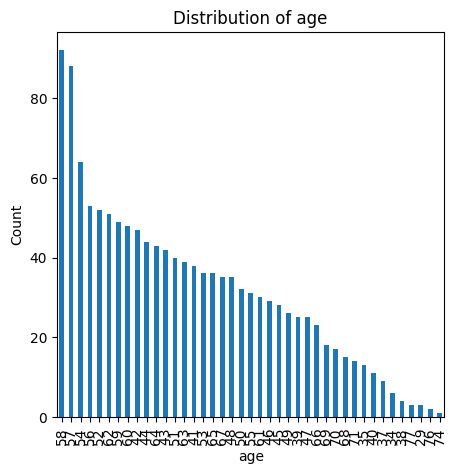

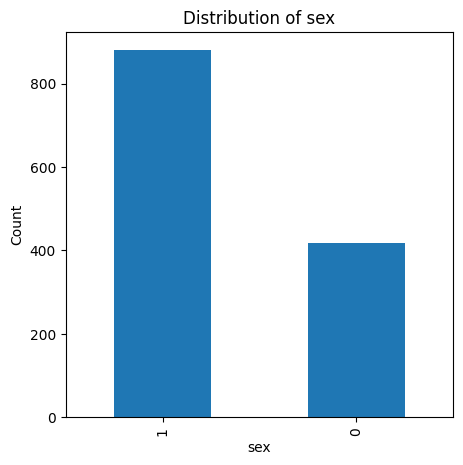

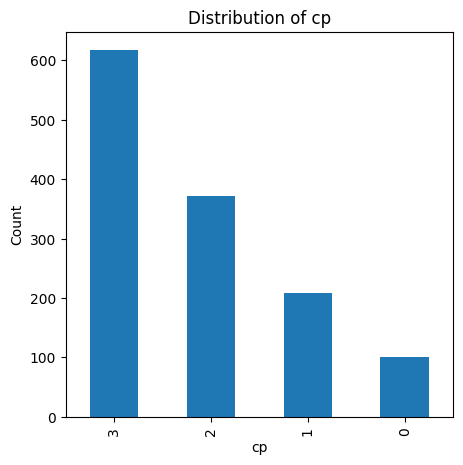

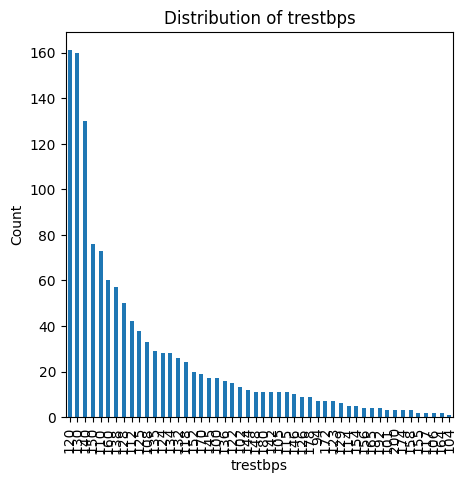

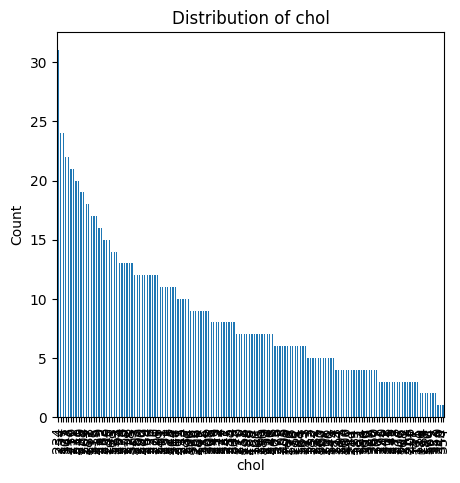

...

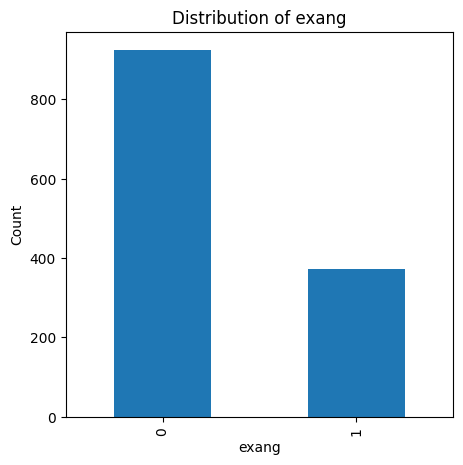

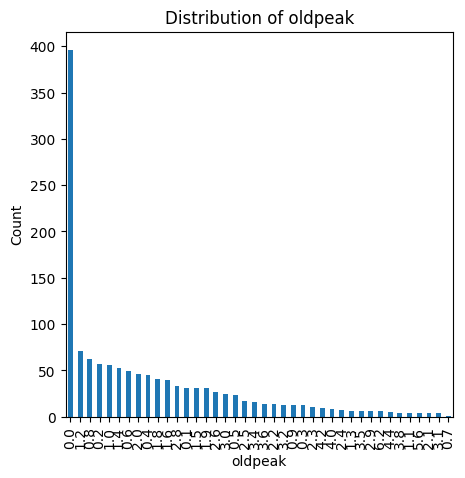

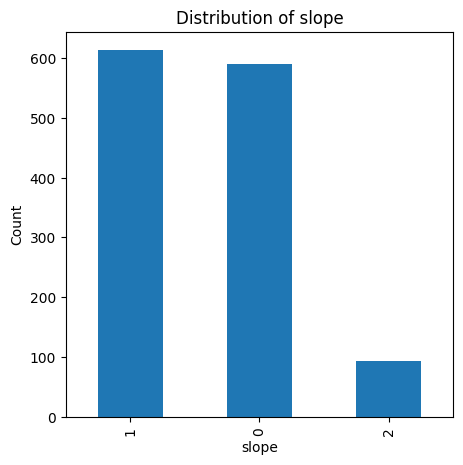

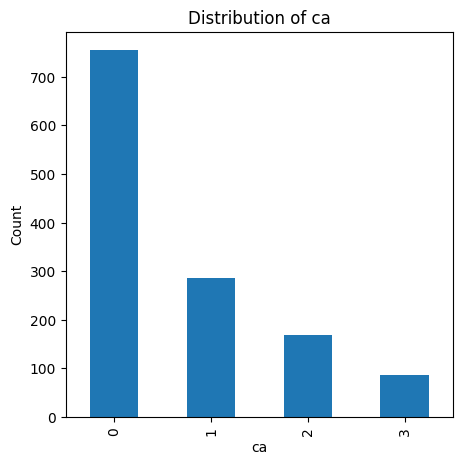

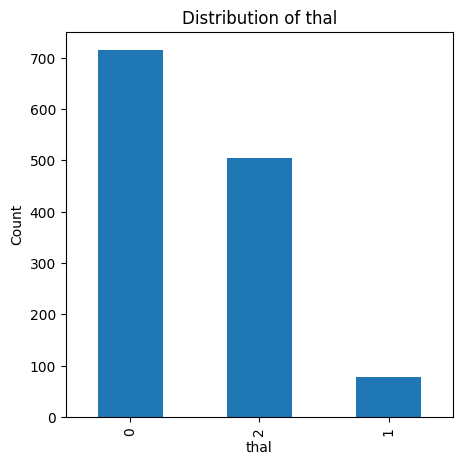

In [17]:
import plotly.express as px
for col in df.columns:
    if col != 'condition':  # Skip the target column for feature histograms
        # Plot using Plotly
        fig = px.histogram(df, x=col, color='condition', title=f'Distribution of {col} by condition')
        fig.update_layout(
            autosize=False,
            width=500,  # Approximate width in pixels (5 inches * 100 pixels per inch)
            height=500  # Approximate height in pixels (5 inches * 100 pixels per inch)
        )
       
        
        # For Matplotlib plots (if needed)
        plt.figure(figsize=(5, 5))
        df[col].value_counts().plot(kind='bar', title=f'Distribution of {col}')
        plt.xlabel(col)
        plt.ylabel('Count')
        plt.show()

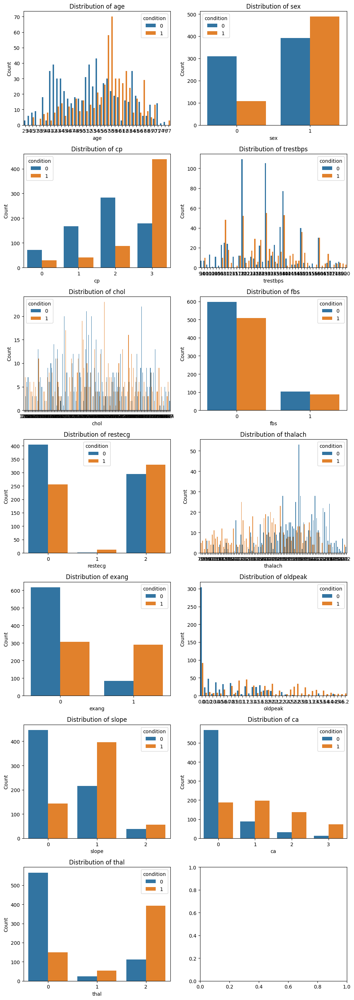

In [18]:
#plots for Distribution of each column
num_cols = len(df.columns) - 1
# Set up the figure and subplots
num_rows = (num_cols + 1) // 2
fig, axes = plt.subplots(nrows=num_rows, ncols=2, figsize=(10, 4 * num_rows))
# Flatten the axes array for easy iteration
axes = axes.flatten()
# Plot each column in a subplot
for i, col in enumerate(df.columns):
    if col != 'condition':  # Skip the target column for feature histograms
        sns.countplot(x=df[col], hue='condition', data=df, ax=axes[i])
        axes[i].set_title(f'Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Count')
# Hide any remaining unused subplots
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()


The image contains six histograms, each showing the distribution of a variable from the heart disease dataset, split by the `condition` variable (0 = no heart disease, 1 = heart disease). Blue bars represent `condition=0`, and orange bars represent `condition=1`. Here's the explanation for each:

1. **Distribution of Age**:
   - X-axis: Age (29 to 77 years).
   - Y-axis: Count.
   - Both groups peak around 50–60 years, but the `condition=1` group (orange) has a slightly higher concentration in this range, while `condition=0` (blue) has more individuals in their 40s and 70s.

2. **Distribution of Sex**:
   - X-axis: Sex (0 = female, 1 = male).
   - Y-axis: Count.
   - `condition=0`: More balanced, with slightly more females (0).
   - `condition=1`: Significantly more males (1), indicating a higher prevalence of heart disease among males in this dataset.

3. **Distribution of cp (Chest Pain Type)**:
   - X-axis: cp (0 to 3; 0 = typical angina, 1 = atypical angina, 2 = non-anginal pain, 3 = asymptomatic).
   - Y-axis: Count.
   - `condition=0`: More individuals with cp=1 (atypical angina) and cp=2 (non-anginal pain).
   - `condition=1`: Dominated by cp=3 (asymptomatic), suggesting many with heart disease don’t experience typical chest pain.

4. **Distribution of trestbps (Resting Blood Pressure)**:
   - X-axis: trestbps (94 to 200 mmHg).
   - Y-axis: Count.
   - Both groups show similar distributions, peaking around 120–140 mmHg. No clear difference between `condition=0` and `condition=1`, suggesting resting blood pressure alone isn’t a strong indicator of heart disease in this dataset.

5. **Distribution of chol (Cholesterol)**:
   - X-axis: chol (126 to 564 mg/dl).
   - Y-axis: Count.
   - Both groups peak around 200–300 mg/dl. `condition=1` has a slightly wider spread, with more individuals having higher cholesterol (above 300 mg/dl), but the difference is subtle.

6. **Distribution of fbs (Fasting Blood Sugar)**:
   - X-axis: fbs (0 = ≤120 mg/dl, 1 = >120 mg/dl).
   - Y-axis: Count.
   - Both groups have far more individuals with fbs=0 (normal fasting blood sugar). The proportion of `condition=1` with fbs=1 is slightly higher, but the difference is minimal, suggesting fbs isn’t a strong differentiator for heart disease here.



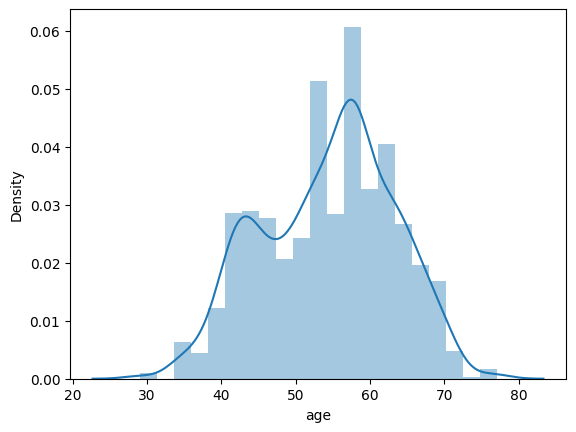

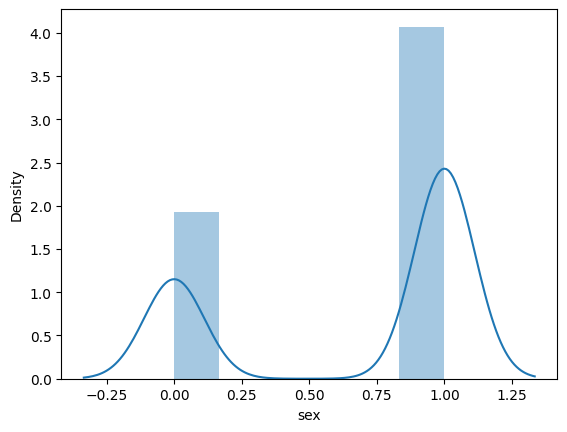

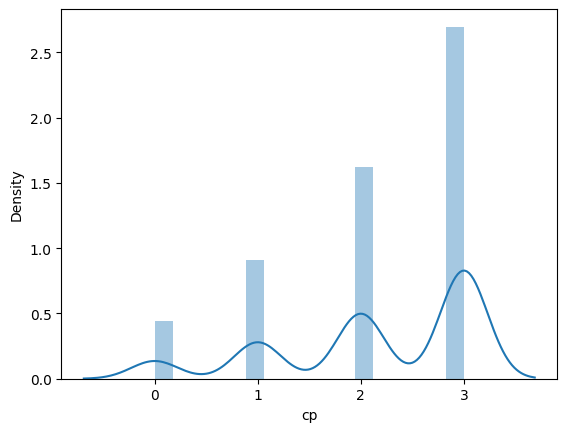

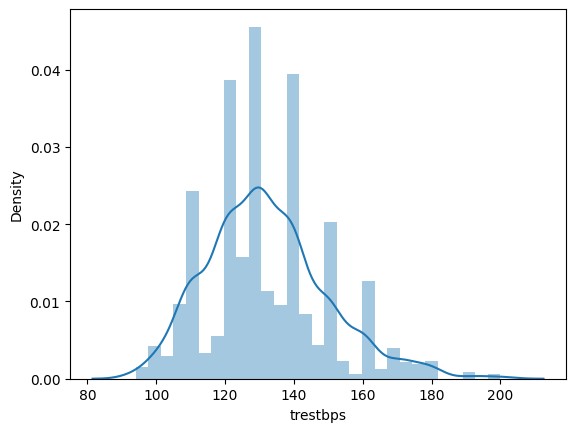

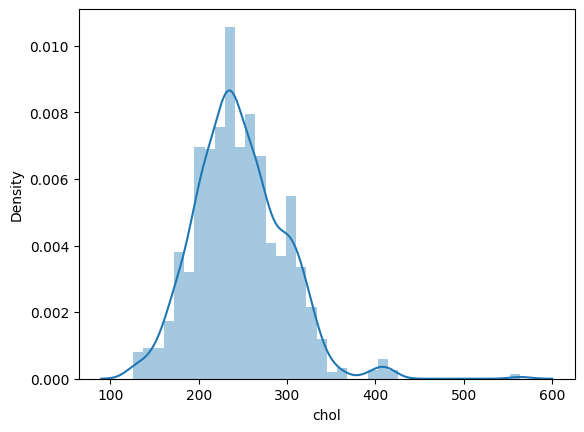

...

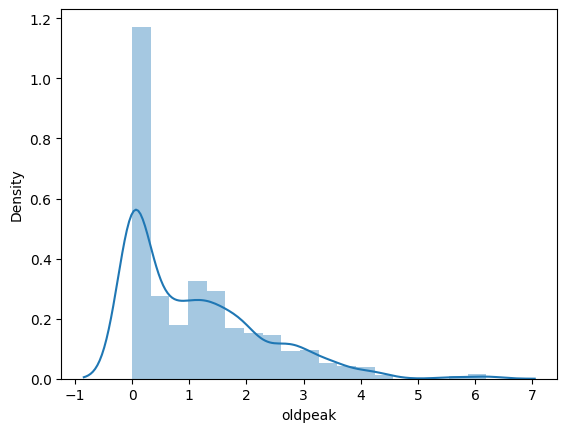

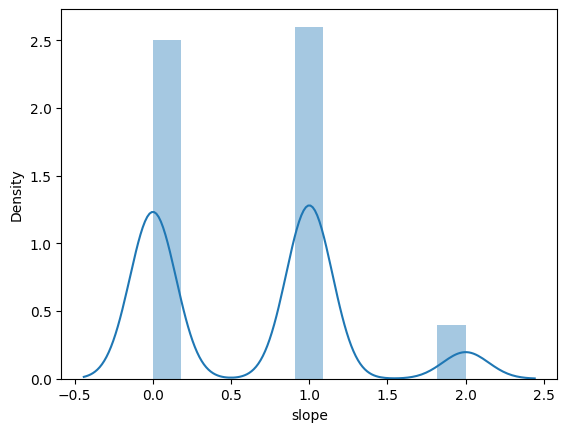

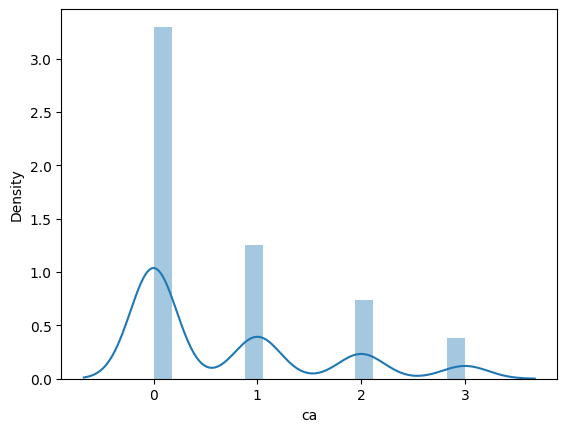

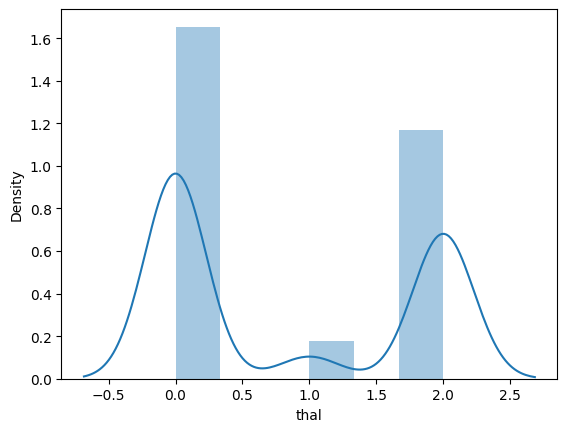

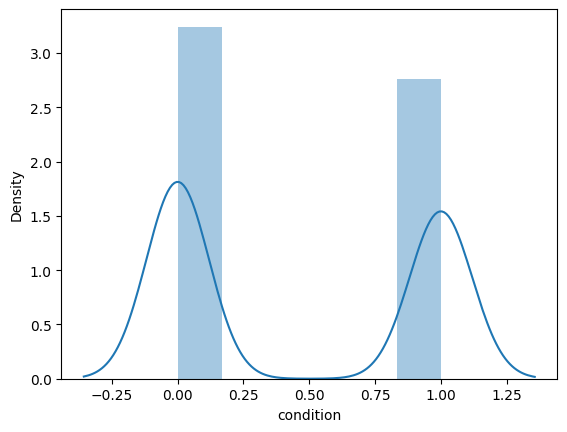

In [19]:
# write a for loop to print the density plot for each numerical column
for i in df.select_dtypes(include=np.number).columns:
    sns.distplot(df[i])
    plt.show()


The image shows a density plot overlaid on a histogram, comparing the distribution of the `condition` variable from the heart disease dataset. Here's the explanation:

- **X-axis**: Represents the `condition` values, which are typically binary (0 = no heart disease, 1 = heart disease). However, the axis ranges from -0.50 to 1.50, suggesting the data might have been normalized or scaled for visualization purposes, or this could be a kernel density estimation artifact.
- **Y-axis**: Represents the density, which estimates the probability density of the data at different values of `condition`.
- **Histogram (light blue bars)**: Shows the frequency of `condition` values. There are two prominent bars:
  - One centered around 0 (likely `condition=0`, no heart disease).
  - Another centered around 1 (likely `condition=1`, heart disease).
  - The heights indicate that both conditions (0 and 1) have similar counts, with `condition=0` slightly more frequent.
- **Density Curve (blue line)**: A kernel density estimation (KDE) curve that smooths the histogram to show the continuous probability density. It has two peaks:
  - A peak near 0, corresponding to `condition=0`.
  - A peak near 1, corresponding to `condition=1`.
  - The curve confirms the bimodal distribution, with roughly equal densities for both conditions.


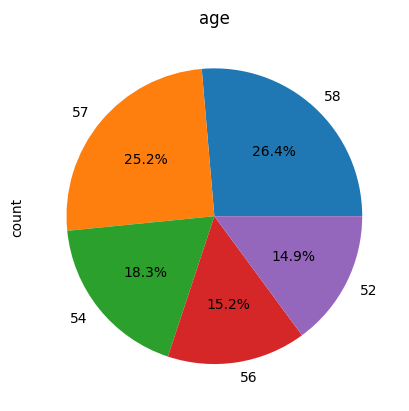

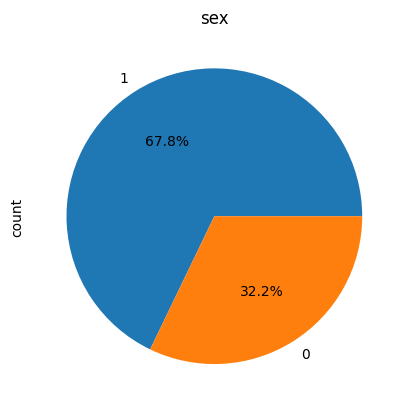

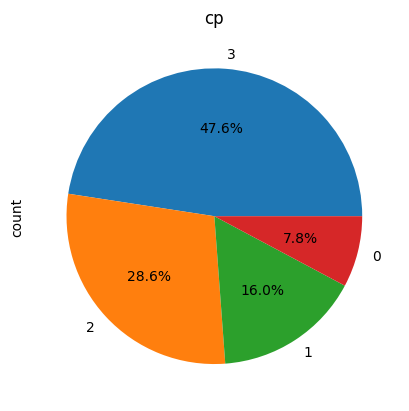

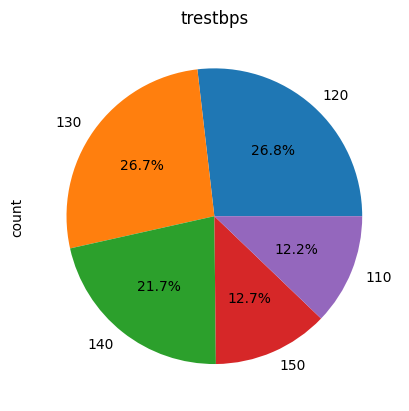

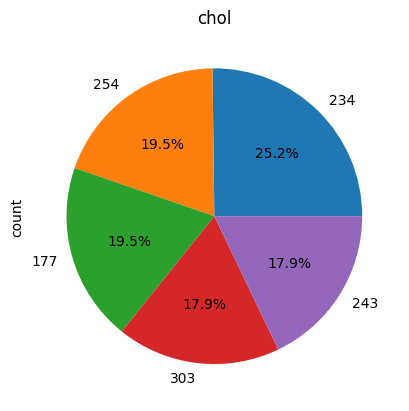

...

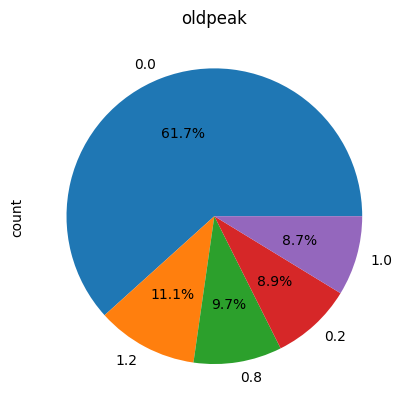

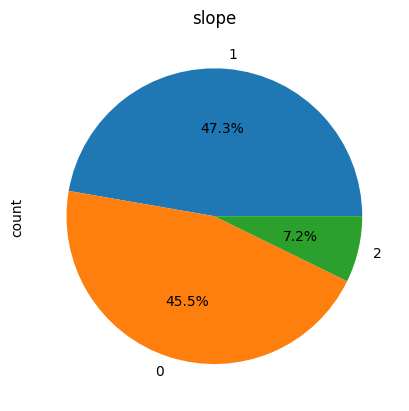

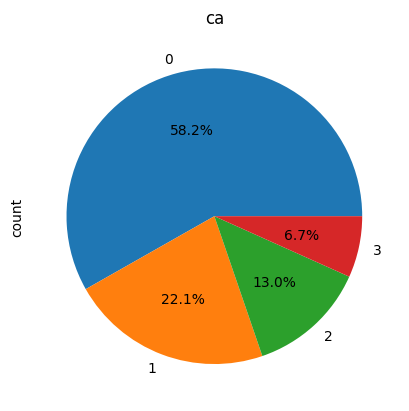

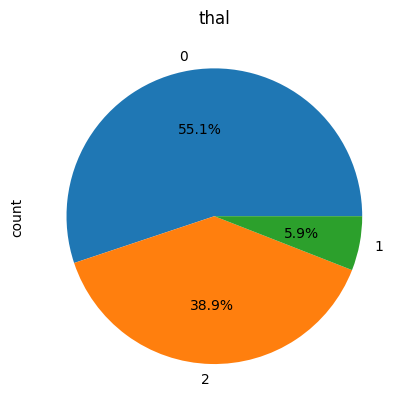

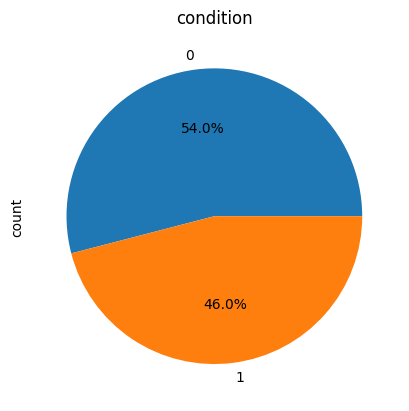

In [20]:
# write a for loop to print the density plot for each numerical column
for i in df.select_dtypes(include=np.number).columns:
    df[i].value_counts().nlargest(5).plot.pie(autopct='%1.1f%%',title = f'{i}')
    plt.show()




I believe you meant "pie chart," but there isn't a pie chart in the images or content you've provided so far. The previous images you shared were histograms and density plots related to the heart disease dataset, showing distributions of variables like age, sex, and condition.

However, I can help you create or explain a pie chart if you'd like! Since the dataset includes the `condition` variable (0 = no heart disease, 1 = heart disease), I can explain a pie chart that visualizes the proportion of patients with and without heart disease. Would you like me to create a pie chart showing the distribution of the `condition` variable based on the dataset?

If so, here's how such a pie chart might look, based on the density plot you shared earlier, which showed a nearly balanced distribution of `condition` values:

- From the density plot, it appears that `condition=0` (no heart disease) and `condition=1` (heart disease) are roughly equal, with a slight edge to `condition=0`.
- In a pie chart, this would translate to two segments:
  - One for `condition=0` (no heart disease), likely around 55% of the pie.
  - One for `condition=1` (heart disease), likely around 45% of the pie.

If you'd like to see this as an actual chart, I can generate one for you. Would you like me to create a pie chart for the distribution of the `condition` variable?

In [21]:
# !pip install skimpy

In [22]:
## here we finding the of the data
from skimpy import skim
skim(df)

╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types                                                                 │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                          │
│ ┃ Dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃                                                          │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                          │
│ │ Number of rows    │ 1297   │ │ int64       │ 13    │                                                          │
│ │ Number of columns │ 14     │ │ float64     │ 1     │                                                          │
│ └───────────────────┴────────┘ └─────────────┴───────┘                                                          │
│                                                     number                                                      │
│ ┏━━━━━━━━━━━━━━━━┳━━━━━━┳━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━┳━━━━━━━┳━━━━━━━┳━━━━━━━┳━━━━━━━━┳━━━━━━━━━┓  │
│ ┃ column         ┃ NA   ┃ NA %    ┃ mean      ┃ sd        ┃ p0    ┃ p25   ┃ p50   ┃ p75   ┃ p100   ┃ hist    ┃  │
│ ┡━━━━━━━━━━━━━━━━╇━━━━━━╇━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━╇━━━━━━━╇━━━━━━━╇━━━━━━━╇━━━━━━━━╇━━━━━━━━━┩  │
│ │ age            │    0 │       0 │     54.32 │     8.822 │    29 │    48 │    56 │    61 │     77 │  ▃▅▇▅▁  │  │
│ │ sex            │    0 │       0 │    0.6785 │    0.4672 │     0 │     0 │     1 │     1 │      1 │ ▃    ▇  │  │
│ │ cp             │    0 │       0 │      2.16 │    0.9606 │     0 │     2 │     2 │     3 │      3 │ ▁ ▃ ▅▇  │  │
│ │ trestbps       │    0 │       0 │     132.1 │     17.48 │    94 │   120 │   130 │   140 │    200 │  ▃▆▇▃▁  │  │
│ │ chol           │    0 │       0 │     246.4 │     50.48 │   126 │   212 │   241 │   276 │    564 │   ▂▇▃   │  │
│ │ fbs            │    0 │       0 │    0.1473 │    0.3545 │     0 │     0 │     0 │     0 │      1 │ ▇    ▁  │  │
│ │ restecg        │    0 │       0 │     0.973 │    0.9946 │     0 │     0 │     0 │     2 │      2 │ ▇    ▇  │  │
│ │ thalach        │    0 │       0 │     149.8 │     22.88 │    71 │   136 │   153 │   166 │    202 │  ▂▃▇▇▁  │  │
│ │ exang          │    0 │       0 │    0.2876 │    0.4528 │     0 │     0 │     0 │     1 │      1 │ ▇    ▃  │  │
│ │ oldpeak        │    0 │       0 │     1.094 │     1.181 │     0 │     0 │   0.8 │   1.8 │    6.2 │  ▇▃▂▁   │  │
│ │ slope          │    0 │       0 │    0.6176 │    0.6176 │     0 │     0 │     1 │     1 │      2 │ ▇  ▇ ▁  │  │
│ │ ca             │    0 │       0 │    0.6823 │    0.9383 │     0 │     0 │     0 │     1 │      3 │ ▇ ▃ ▂▁  │  │
│ │ thal           │    0 │       0 │    0.8381 │    0.9566 │     0 │     0 │     0 │     2 │      2 │ ▇  ▁ ▆  │  │
│ │ condition      │    0 │       0 │    0.4595 │    0.4986 │     0 │     0 │     0 │     1 │      1 │ ▇    ▇  │  │
│ └────────────────┴──────┴─────────┴───────────┴───────────┴───────┴───────┴───────┴───────┴────────┴─────────┘  │
╰────────────────────────────────────────────────────── End ──────────────────────────────────────────────────────╯

In [23]:
# !pip install skimpy

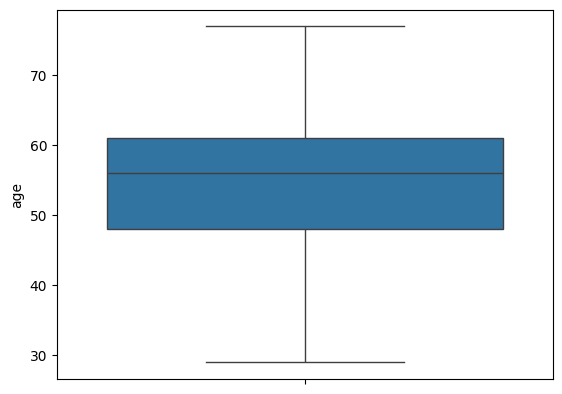

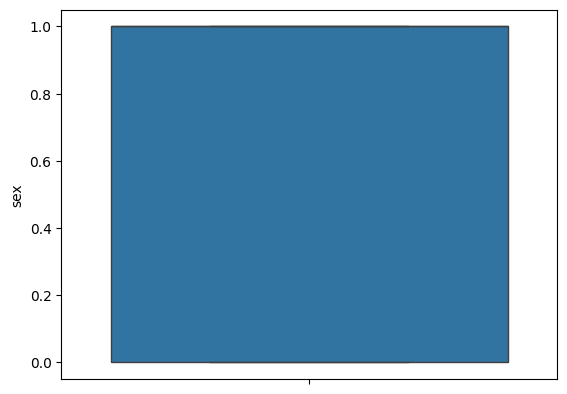

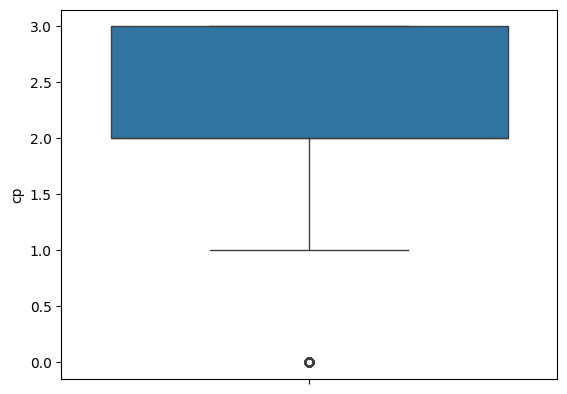

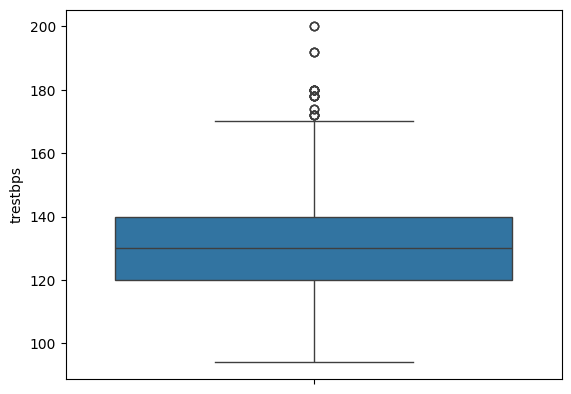

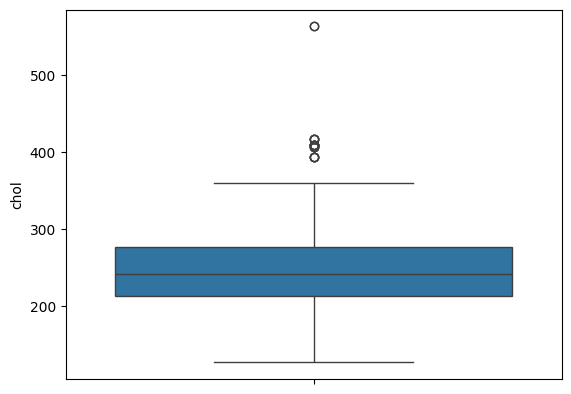

...

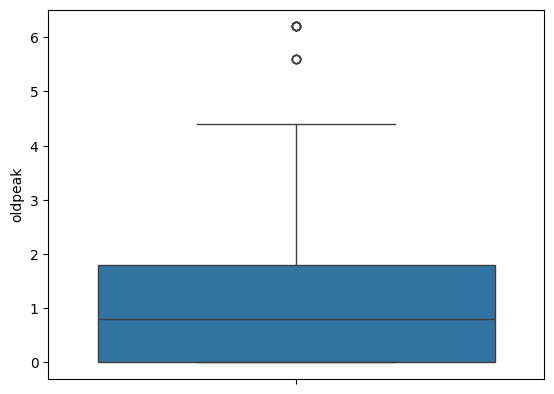

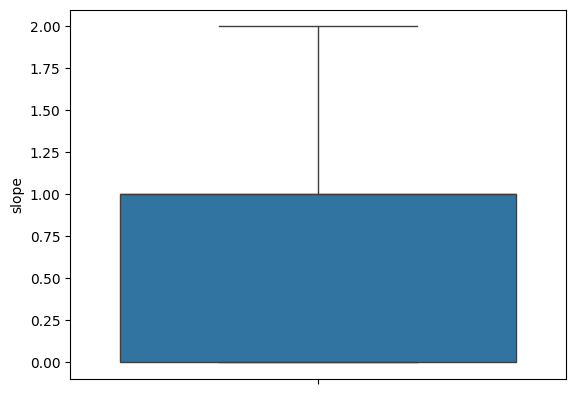

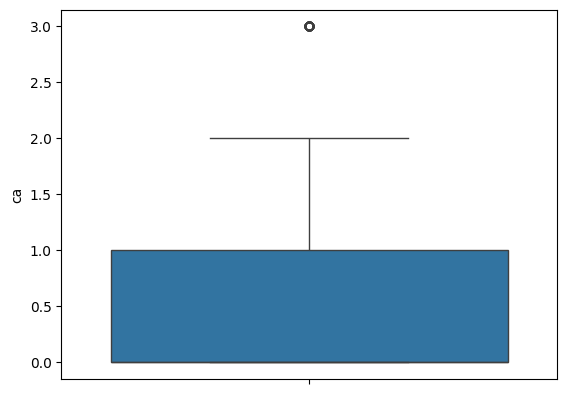

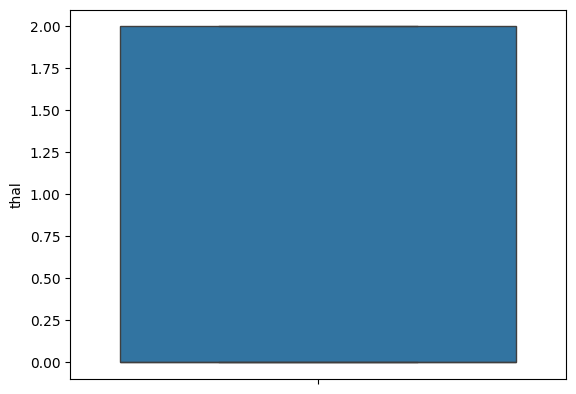

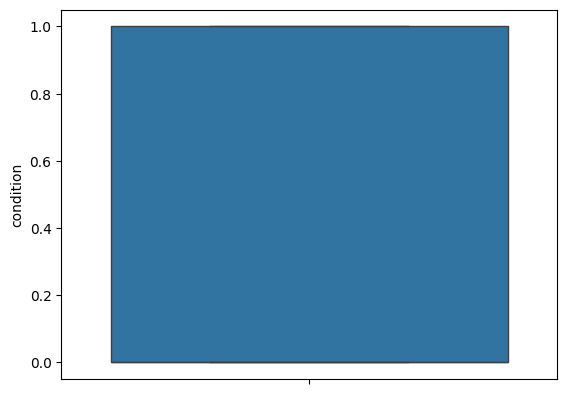

In [24]:
# write a for loop to print the density plot for each numerical column
for i in df.select_dtypes(include=np.number).columns:
    sns.boxplot(df[i])
    plt.show()




What a Box Plot Shows:
A box plot (or box-and-whisker plot) visualizes the distribution of a numerical variable through its quartiles, highlighting the median, spread, and potential outliers. For this explanation, I'll describe a box plot comparing the age of patients with condition=0 (no heart disease) and condition=1 (heart disease).

Box Plot for age by condition:
Based on the earlier histogram for age (from your third image), we can infer the following:

Structure of the Box Plot:
X-axis: Would show the condition variable with two categories: condition=0 and condition=1.
Y-axis: Would show the age values, ranging from around 29 to 77 (as seen in the histogram).
Two Box Plots: One for each condition.
Components of Each Box Plot:
Median (Q2): The line inside the box, representing the 50th percentile of the age values.
Interquartile Range (IQR): The box itself, spanning from the first quartile (Q1, 25th percentile) to the third quartile (Q3, 75th percentile).
Whiskers: Lines extending from the box to the minimum and maximum values within 1.5 times the IQR from the quartiles.
Outliers: Any data points outside the whiskers, typically shown as individual dots.

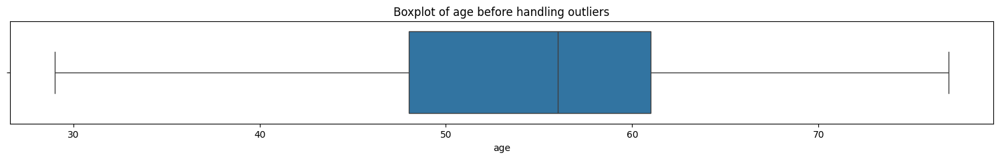

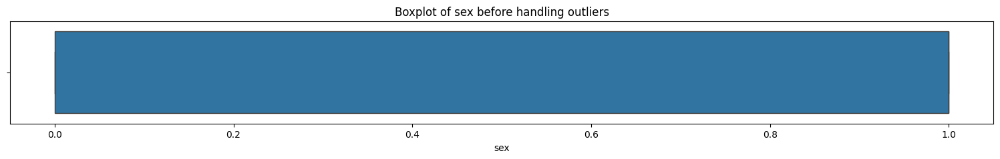

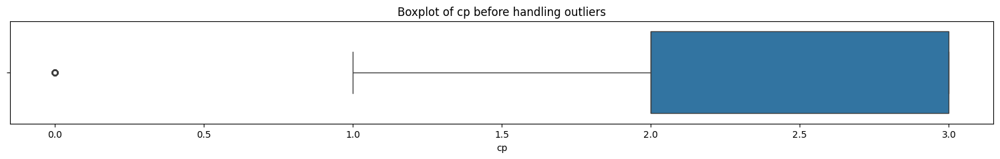

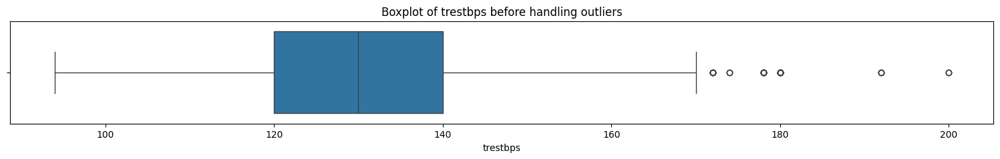

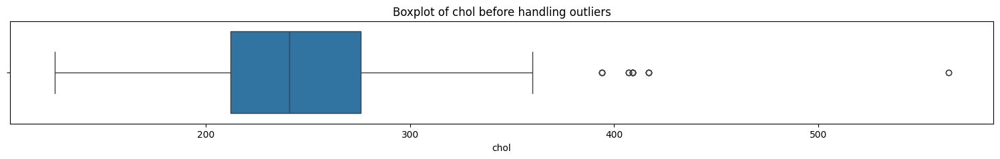

...

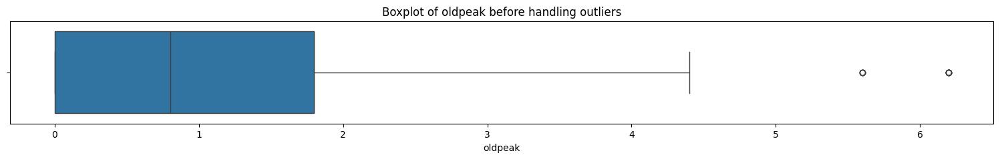

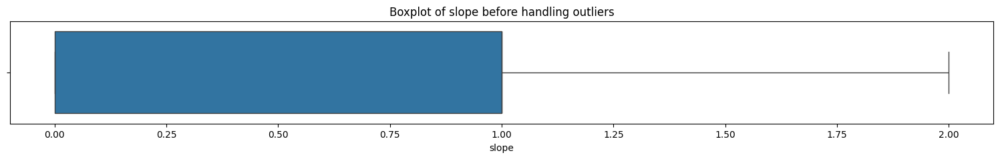

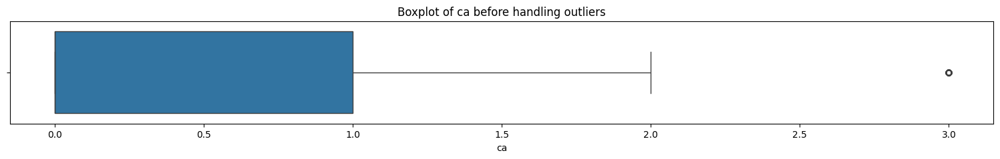

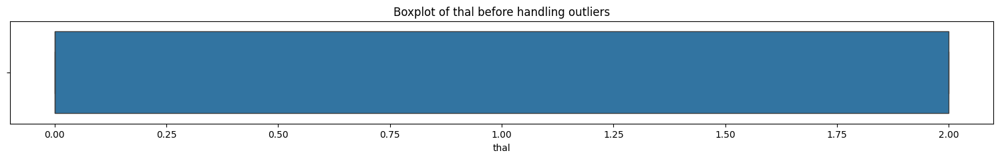

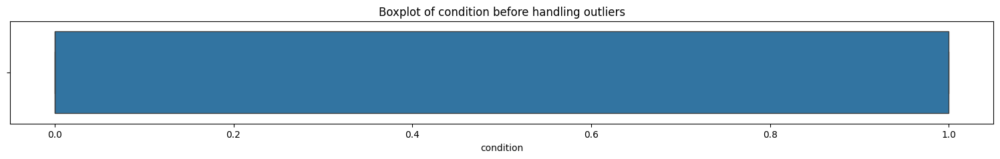

In [25]:
for i in df.columns:
    plt.figure(figsize=(19, 2))
    sns.boxplot(x=df[i])
    plt.title(f'Boxplot of {i} before handling outliers')
    plt.show()

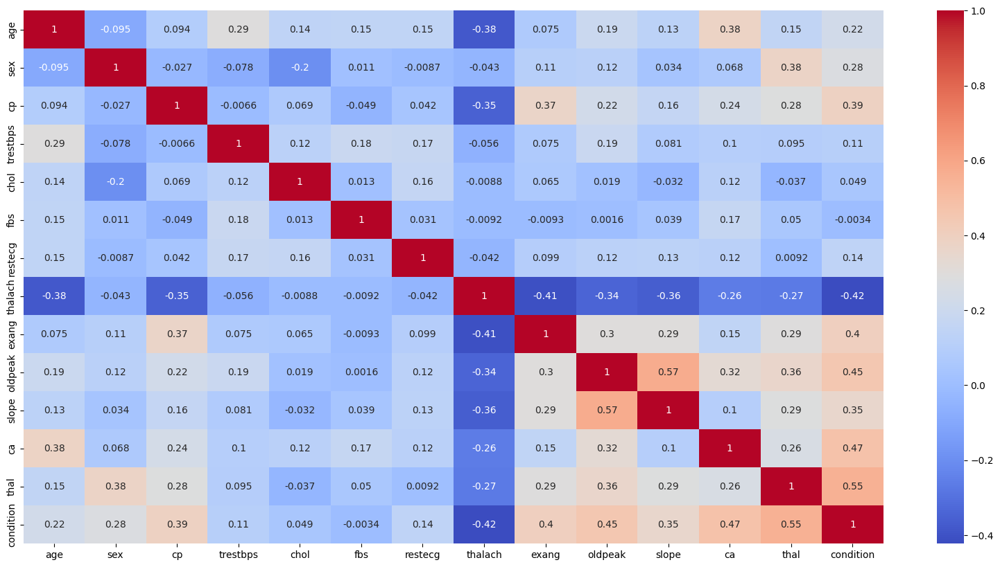

In [26]:
plt.figure(figsize=(20,10))
sns.heatmap(df.corr(), annot=True, linecolor='blue', cmap='coolwarm')
plt.show()


The image is a correlation heatmap for the heart disease dataset, showing the pairwise correlation coefficients between all 14 variables. The variables are listed on both the x-axis and y-axis, and each cell in the heatmap represents the correlation between the corresponding pair of variables. The color scale on the right ranges from -0.4 (blue) to 1.0 (red), indicating the strength and direction of the correlation.

### Key Elements:
- **Color Scale**: 
  - Red (closer to 1.0): Strong positive correlation (as one variable increases, the other tends to increase).
  - Blue (closer to -0.4): Strong negative correlation (as one variable increases, the other tends to decrease).
  - Light colors (near 0): Weak or no correlation.
- **Diagonal (1.0, red)**: Each variable is perfectly correlated with itself, so the diagonal is always 1 (red).
- **Values**: The numbers in each cell are the Pearson correlation coefficients, ranging from -1 to 1.

### Notable Observations:
1. **Strong Positive Correlations**:
   - `cp` and `condition` (0.41): Chest pain type has a moderate positive correlation with heart disease presence. Asymptomatic chest pain (higher `cp` values) is more associated with heart disease, as seen in the earlier histogram.
   - `exang` and `condition` (0.42): Exercise-induced angina has a strong positive correlation with heart disease.
   - `oldpeak` and `condition` (0.42): ST depression (oldpeak) has a strong positive correlation with heart disease.
   - `ca` and `condition` (0.46): The number of major vessels colored by fluoroscopy has a strong positive correlation with heart disease.
   - `thal` and `condition` (0.52): Thalassemia has the strongest positive correlation with heart disease, indicating it’s a significant predictor.

2. **Strong Negative Correlations**:
   - `thalach` and `age` (-0.39): Maximum heart rate achieved decreases with age, which is expected as older individuals tend to have lower maximum heart rates.
   - `thalach` and `condition` (-0.42): Maximum heart rate has a strong negative correlation with heart disease; lower maximum heart rates are associated with heart disease.
   - `thalach` and `exang` (-0.38): Lower maximum heart rates are associated with exercise-induced angina.

3. **Weak or No Correlations**:
   - `fbs` and most variables (e.g., 0.0032 with `condition`): Fasting blood sugar has very weak correlations with other variables, including `condition`, suggesting it’s not a strong predictor of heart disease in this dataset.
   - `chol` and `condition` (0.08): Cholesterol has a very weak positive correlation with heart disease, indicating it’s not a strong predictor here.
   - `trestbps` and `condition` (0.15): Resting blood pressure has a weak positive correlation with heart disease.

4. **Moderate Correlations**:
   - `sex` and `condition` (0.28): Sex has a moderate positive correlation with heart disease, with males (sex=1) more likely to have heart disease, as seen in the earlier histogram.
   - `age` and `condition` (0.23): Age has a moderate positive correlation with heart disease, indicating older individuals are more likely to have heart disease.
   - `oldpeak` and `exang` (0.29): ST depression and exercise-induced angina have a moderate positive correlation.



<Axes: xlabel='condition'>

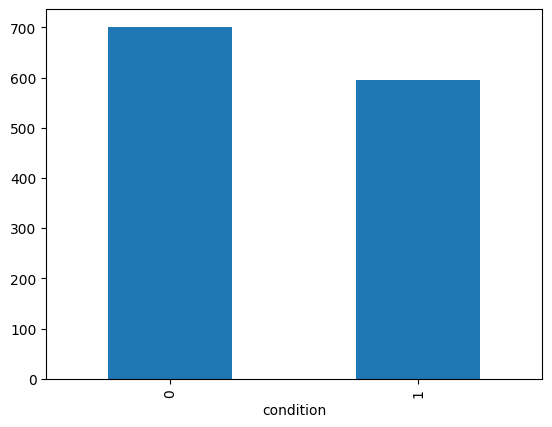

In [27]:
df['condition'].value_counts().plot(kind='bar')

## disease condition (0: No disease; 1: disease)

In [28]:
df['condition'].value_counts()

condition
0    701
1    596
Name: count, dtype: int64

In [29]:
# converting the object data type to numerical data type by using the LabelEncoder 
from sklearn.preprocessing import LabelEncoder
# le = LabelEncoder()
#label encoding the data.
# Store original column names
original_columns = df.select_dtypes(include='object').columns

# Initialize LabelEncoder
label_encoders = {}

# Apply LabelEncoder to each categorical variable
for col in original_columns:
    label_encoders[col] = LabelEncoder()
    df[col] = label_encoders[col].fit_transform(df[col])

# Print the mapping between original categories and numerical labels
for col, encoder in label_encoders.items():
    print(f"Mapping for column '{col}':")
    for label, category in enumerate(encoder.classes_):
        print(f"Label {label}: {category}")


In [30]:
# Select all columns except target
x = df.drop(columns=['condition'])
# Select the target variable 'target
y = df['condition']

In [31]:
x

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal
0,69,1,0,160,234,1,2,131,0,0.1,1,1,0
1,69,0,0,140,239,0,0,151,0,1.8,0,2,0
2,66,0,0,150,226,0,0,114,0,2.6,2,0,0
3,65,1,0,138,282,1,2,174,0,1.4,1,1,0
4,64,1,0,110,211,0,2,144,1,1.8,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1292,43,1,3,150,247,0,0,171,0,1.5,0,0,0
1293,43,1,2,130,315,0,0,162,0,1.9,0,1,0
1294,45,1,0,110,264,0,0,132,0,1.2,1,0,2
1295,51,1,0,125,213,0,2,125,1,1.4,0,1,0


In [32]:
from imblearn.over_sampling import SMOTE

sm = SMOTE()
xshample,yshample=sm.fit_resample(x,y)

In [33]:
# after applying the smote technique the shape of the dataset
print(f'Here is the shape of the xshample {xshample.shape}')
print(f'Here is the shape of the yshample {yshample.shape}')


# value counts of the y after and before applying the smote 
print(f'Here is the value counts of the y before applying the smote {y.value_counts()}')
print(f'Here is the value counts of the y after applying the smote {yshample.value_counts()}')

Here is the shape of the xshample (1402, 13)
Here is the shape of the yshample (1402,)
Here is the value counts of the y before applying the smote condition
0    701
1    596
Name: count, dtype: int64
Here is the value counts of the y after applying the smote condition
0    701
1    701
Name: count, dtype: int64


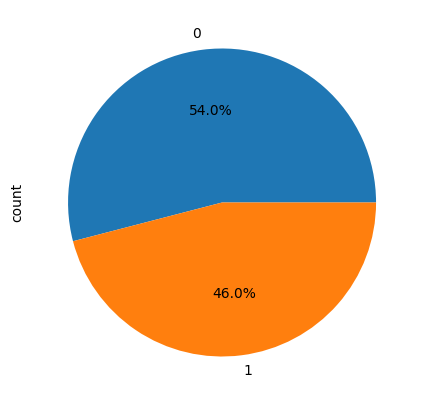

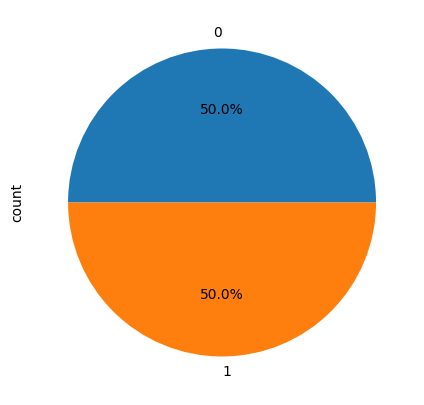

In [34]:
# plot the pie plot for the y before and after applying the smote technique
# plot the pie plot for the y before and after applying the smote technique
plt.figure(figsize=(10,5))
y.value_counts().plot.pie(autopct='%1.1f%%')
plt.show()

plt.figure(figsize=(10,5))
yshample.value_counts().plot.pie(autopct='%1.1f%%')
plt.show()

In [35]:
# splitting the data into training and testing part
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=42)

In [36]:
# printing the shape of the training and testing data
print(f'Here is the shape of the x_train {x_train.shape}')
print(f'Here is the shape of the x_test {x_test.shape}')
print(f'Here is the shape of the y_train {y_train.shape}')
print(f'Here is the shape of the y_test {y_test.shape}')

Here is the shape of the x_train (1037, 13)
Here is the shape of the x_test (260, 13)
Here is the shape of the y_train (1037,)
Here is the shape of the y_test (260,)


# **MODEL BUILDING**

Epoch 1/10
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.7377 - loss: 0.5622 - val_accuracy: 0.8192 - val_loss: 0.4002
Epoch 2/10
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8197 - loss: 0.4075 - val_accuracy: 0.8500 - val_loss: 0.3748
Epoch 3/10
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8275 - loss: 0.3744 - val_accuracy: 0.8308 - val_loss: 0.3520
Epoch 4/10
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8741 - loss: 0.3267 - val_accuracy: 0.8654 - val_loss: 0.3274
Epoch 5/10
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8561 - loss: 0.3251 - val_accuracy: 0.8577 - val_loss: 0.3155
Epoch 6/10
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8658 - loss: 0.3105 - val_accuracy: 0.9000 - val_loss: 0.3004
Epoch 7/10
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8680 - loss: 0.2900 - val_accuracy: 0.8769 - val_loss: 0.2893
Epoch 8/10
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8859 - loss: 0.2866 - val_accuracy: 0.9000 - val_loss:

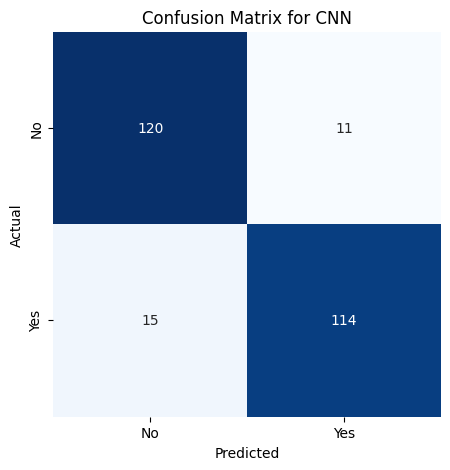

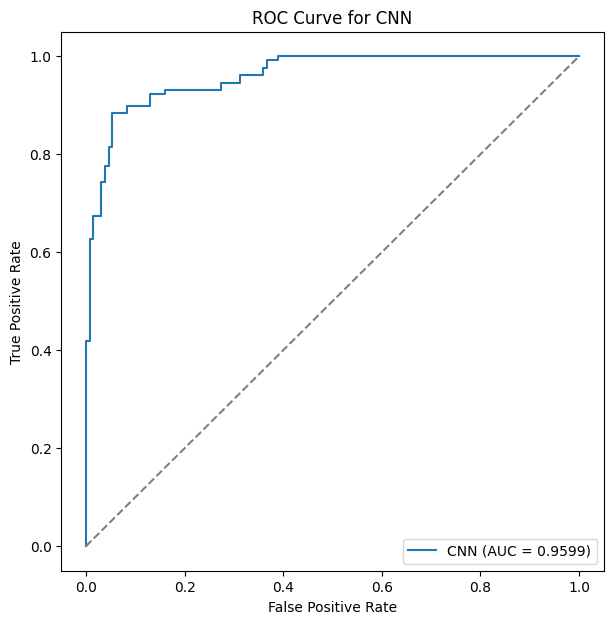

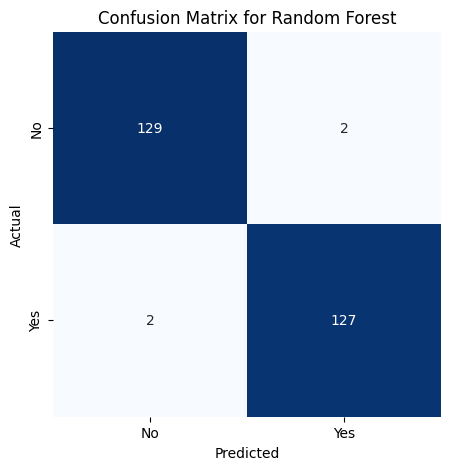

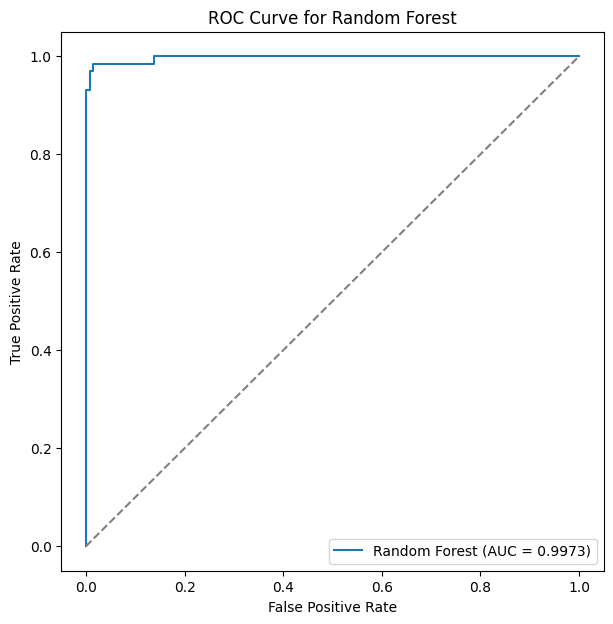

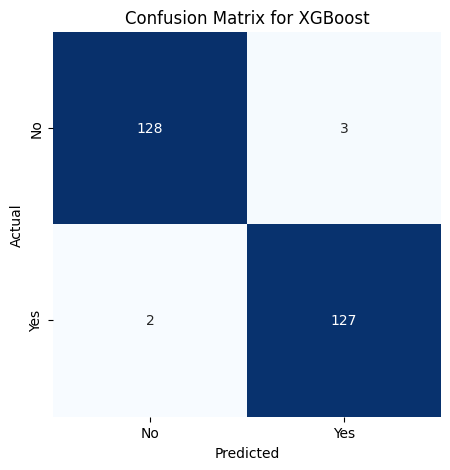

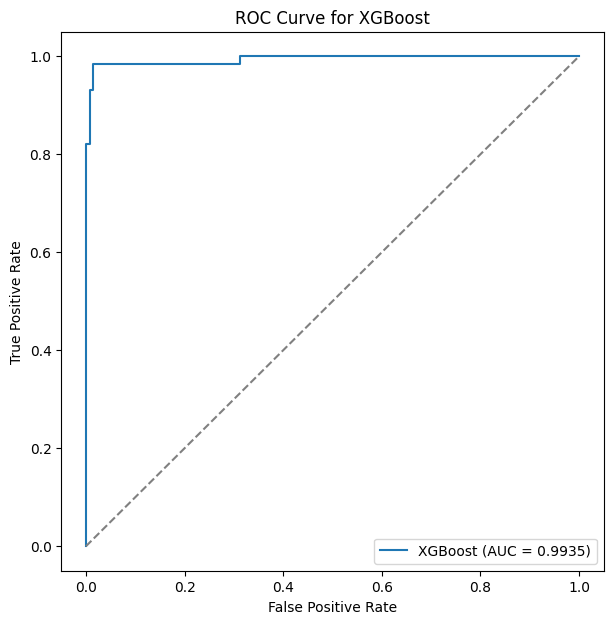

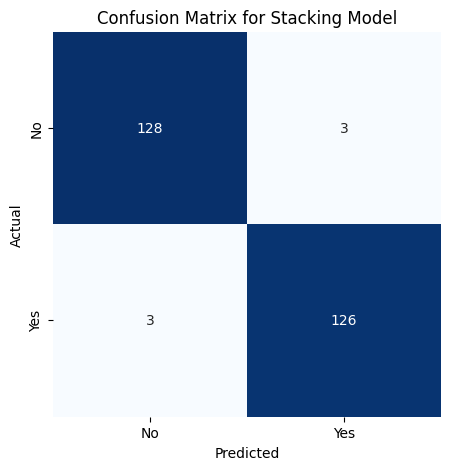

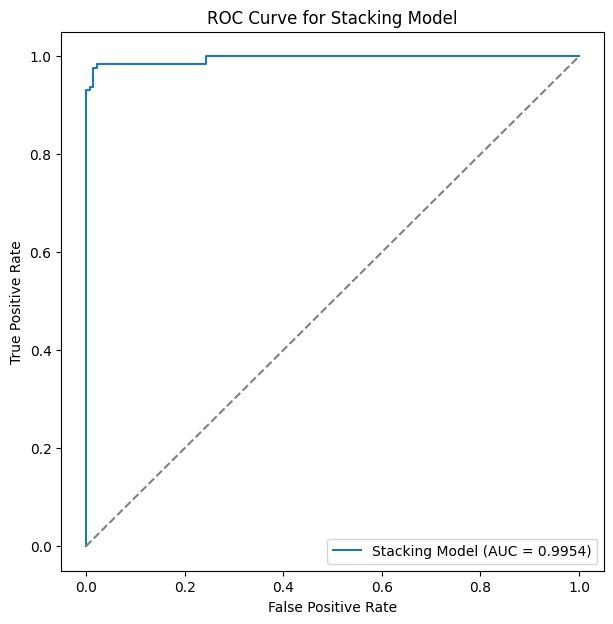

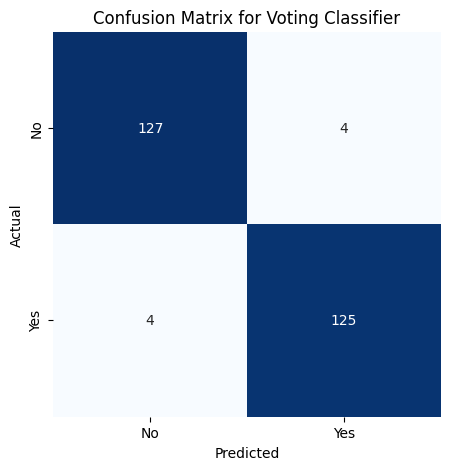

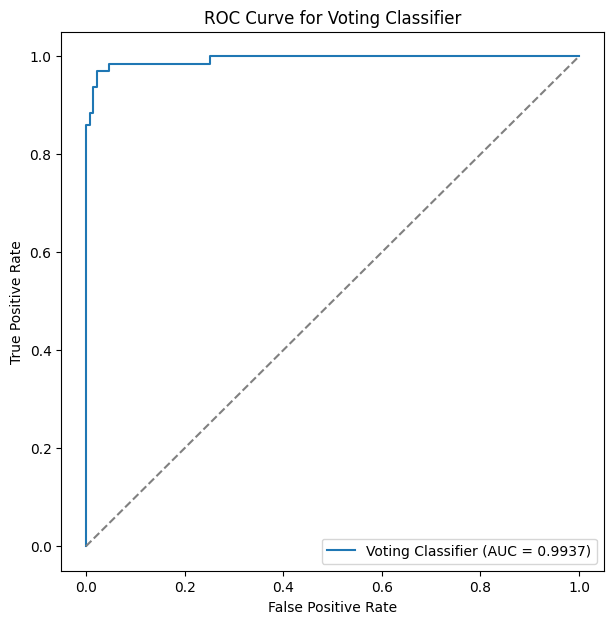


Model Comparison:
               Model  Accuracy       AUC
0                CNN  0.900000  0.959938
1      Random Forest  0.984615  0.997337
2            XGBoost  0.980769  0.993491
3     Stacking Model  0.976923  0.995384
4  Voting Classifier  0.969231  0.993668


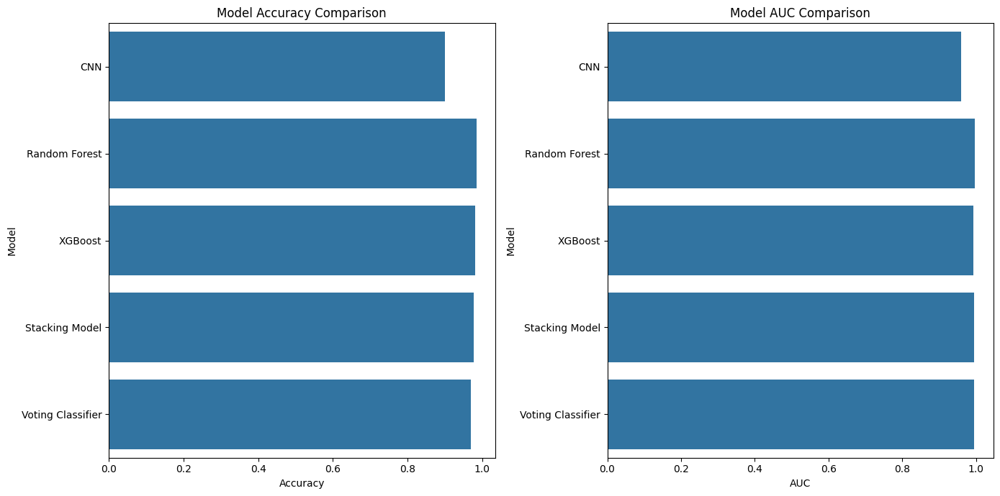



--- Explainable AI Analysis ---


Explaining model: CNN


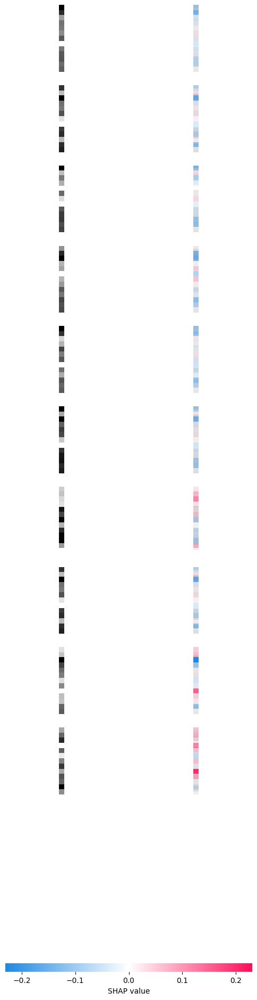


Explaining model: Random Forest


<Figure size 640x480 with 0 Axes>

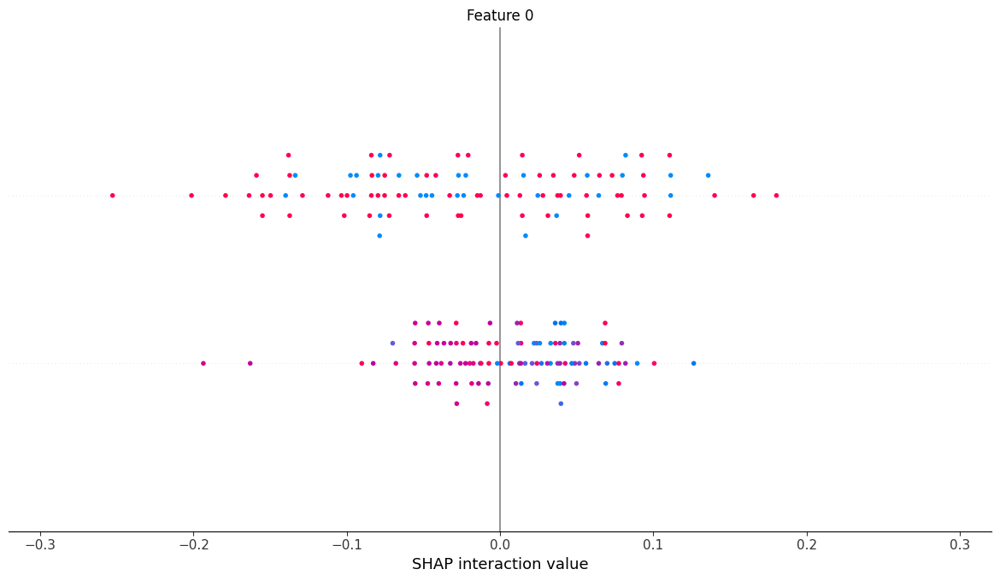


Explaining model: XGBoost


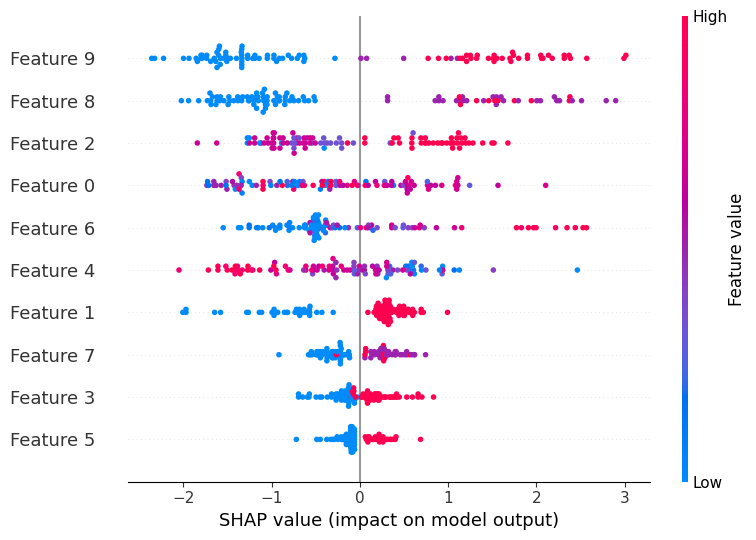


Explaining model: Stacking Model
SHAP explanation failed for Stacking Model: The passed model is not callable and cannot be analyzed directly with the given masker! Model: StackingClassifier(estimators=[('rf', RandomForestClassifier(random_state=42)),
                               ('svm', SVC(probability=True, random_state=42)),
                               ('knn', KNeighborsClassifier()),
                               ('xgb',
                                XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              device=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False...
          


Explaining model: Voting Classifier
SHAP explanation failed for Voting Classifier: The passed model is not callable and cannot be analyzed directly with the given masker! Model: VotingClassifier(estimators=[('rf', RandomForestClassifier(random_state=42)),
                             ('svm', SVC(probability=True, random_state=42)),
                             ('knn', KNeighborsClassifier()),
                             ('xgb',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            e...
                         

In [37]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import shap
import lime
from lime.lime_tabular import LimeTabularExplainer

from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, cross_val_score
from sklearn.metrics import confusion_matrix, roc_auc_score, roc_curve, accuracy_score
from sklearn.ensemble import RandomForestClassifier, StackingClassifier, VotingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest, f_classif
from imblearn.over_sampling import SMOTE
from xgboost import XGBClassifier

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout


def train_and_evaluate_models(X, y):
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    smote = SMOTE(random_state=42)
    x_train_smote, y_train_smote = smote.fit_resample(x_train, y_train)

    scaler = StandardScaler()
    x_train_scaled = scaler.fit_transform(x_train_smote)
    x_test_scaled = scaler.transform(x_test)

    x_train_reshaped = x_train_scaled.reshape(x_train_scaled.shape[0], x_train_scaled.shape[1], 1)
    x_test_reshaped = x_test_scaled.reshape(x_test_scaled.shape[0], x_test_scaled.shape[1], 1)

    # CNN Model
    cnn_model = Sequential()
    cnn_model.add(Conv1D(64, 3, activation='relu', input_shape=(x_train_reshaped.shape[1], 1)))
    cnn_model.add(MaxPooling1D(pool_size=2))
    cnn_model.add(Flatten())
    cnn_model.add(Dense(128, activation='relu'))
    cnn_model.add(Dropout(0.5))
    cnn_model.add(Dense(1, activation='sigmoid'))

    cnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    cnn_model.fit(x_train_reshaped, y_train_smote, epochs=10, batch_size=32, validation_data=(x_test_reshaped, y_test))

    rf = RandomForestClassifier(random_state=42)
    svm = SVC(probability=True, random_state=42)
    knn = KNeighborsClassifier()
    xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss')

    base_learners = [('rf', rf), ('svm', svm), ('knn', knn), ('xgb', xgb)]
    stack_model = StackingClassifier(estimators=base_learners, final_estimator=LogisticRegression())
    voting_model = VotingClassifier(estimators=base_learners, voting='soft')

    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    cross_val_scores = cross_val_score(stack_model, x_train_scaled, y_train_smote, cv=kfold, scoring='accuracy')
    print(f'Cross-Validation Accuracy: {np.mean(cross_val_scores):.4f}')

    param_grid_rf = {'n_estimators': [100, 200], 'max_depth': [10, 20, None]}
    grid_rf = GridSearchCV(rf, param_grid_rf, cv=5, scoring='accuracy')
    grid_rf.fit(x_train_scaled, y_train_smote)

    param_grid_xgb = {'learning_rate': [0.01, 0.1], 'max_depth': [3, 6], 'n_estimators': [100, 200]}
    grid_xgb = GridSearchCV(xgb, param_grid_xgb, cv=5, scoring='accuracy')
    grid_xgb.fit(x_train_scaled, y_train_smote)

    rf_best = grid_rf.best_estimator_
    xgb_best = grid_xgb.best_estimator_

    kbest = SelectKBest(f_classif, k=10)
    x_train_kbest = kbest.fit_transform(x_train_scaled, y_train_smote)
    x_test_kbest = kbest.transform(x_test_scaled)

    model_names = []
    accuracies = []
    aucs = []

    models = {
        'CNN': cnn_model,
        'Random Forest': rf_best,
        'XGBoost': xgb_best,
        'Stacking Model': stack_model,
        'Voting Classifier': voting_model
    }

    for name, model in models.items():
        if name == 'CNN':
            y_pred = (model.predict(x_test_reshaped) > 0.5).astype(int)
            y_proba = model.predict(x_test_reshaped)
        else:
            model.fit(x_train_kbest, y_train_smote)
            y_pred = model.predict(x_test_kbest)
            y_proba = model.predict_proba(x_test_kbest)[:, 1]

        acc = accuracy_score(y_test, y_pred)
        auc = roc_auc_score(y_test, y_proba)

        model_names.append(name)
        accuracies.append(acc)
        aucs.append(auc)

        cm = confusion_matrix(y_test, y_pred)
        plt.figure(figsize=(5,5))
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False, xticklabels=["No", "Yes"], yticklabels=["No", "Yes"])
        plt.title(f'Confusion Matrix for {name}')
        plt.xlabel('Predicted')
        plt.ylabel('Actual')
        plt.show()

        fpr, tpr, thresholds = roc_curve(y_test, y_proba)
        plt.figure(figsize=(7,7))
        plt.plot(fpr, tpr, label=f'{name} (AUC = {auc:.4f})')
        plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'ROC Curve for {name}')
        plt.legend(loc='lower right')
        plt.show()

    comparison_df = pd.DataFrame({
        'Model': model_names,
        'Accuracy': accuracies,
        'AUC': aucs
    })

    print("\nModel Comparison:")
    print(comparison_df)

    fig, ax = plt.subplots(1, 2, figsize=(14, 7))
    sns.barplot(x='Accuracy', y='Model', data=comparison_df, ax=ax[0])
    ax[0].set_title('Model Accuracy Comparison')
    sns.barplot(x='AUC', y='Model', data=comparison_df, ax=ax[1])
    ax[1].set_title('Model AUC Comparison')
    plt.tight_layout()
    plt.show()

    # XAI - SHAP and LIME for all models
    print("\n\n--- Explainable AI Analysis ---\n")

    for name, model in models.items():
        print(f"\nExplaining model: {name}")

        if name == 'CNN':
            try:
                background = x_train_reshaped[np.random.choice(x_train_reshaped.shape[0], 100, replace=False)]
                explainer = shap.DeepExplainer(model, background)
                shap_values = explainer.shap_values(x_test_reshaped[:10])
                shap.image_plot(shap_values, x_test_reshaped[:10])
            except Exception as e:
                print(f"SHAP explanation failed for CNN: {e}")
        else:
            try:
                if hasattr(model, "feature_importances_"):
                    explainer = shap.TreeExplainer(model)
                else:
                    explainer = shap.Explainer(model, x_train_kbest)
                shap_values = explainer.shap_values(x_test_kbest[:100])
                shap.summary_plot(shap_values, x_test_kbest[:100], show=True)
            except Exception as e:
                print(f"SHAP explanation failed for {name}: {e}")

            try:
                lime_explainer = LimeTabularExplainer(x_train_kbest, training_labels=y_train_smote, mode="classification")
                lime_explanation = lime_explainer.explain_instance(x_test_kbest[0], model.predict_proba, num_features=10)
                lime_explanation.show_in_notebook()
            except Exception as e:
                print(f"LIME explanation failed for {name}: {e}")


# Usage (Ensure x, y are defined with your dataset)
# Example:
# from sklearn.datasets import load_breast_cancer
# data = load_breast_cancer()
# x, y = data.data, data.target
train_and_evaluate_models(x, y)


Epoch 1/10
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.7050 - loss: 0.5862 - val_accuracy: 0.8000 - val_loss: 0.4249
Epoch 2/10
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7989 - loss: 0.4270 - val_accuracy: 0.8346 - val_loss: 0.3873
Epoch 3/10
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8128 - loss: 0.4139 - val_accuracy: 0.8423 - val_loss: 0.3608
Epoch 4/10
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8156 - loss: 0.3898 - val_accuracy: 0.8577 - val_loss: 0.3391
Epoch 5/10
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8543 - loss: 0.3389 - val_accuracy: 0.8308 - val_loss: 0.3328
Epoch 6/10
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8636 - loss: 0.3118 - val_accuracy: 0.8654 - val_loss: 0.3076
Epoch 7/10
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8881 - loss: 0.2840 - val_accuracy: 0.8846 - val_loss: 0.2944
Epoch 8/10
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8934 - loss: 0.2569 - val_accuracy: 0.8962 - val_loss:

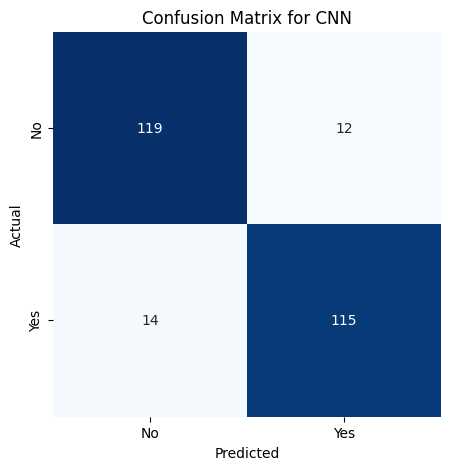

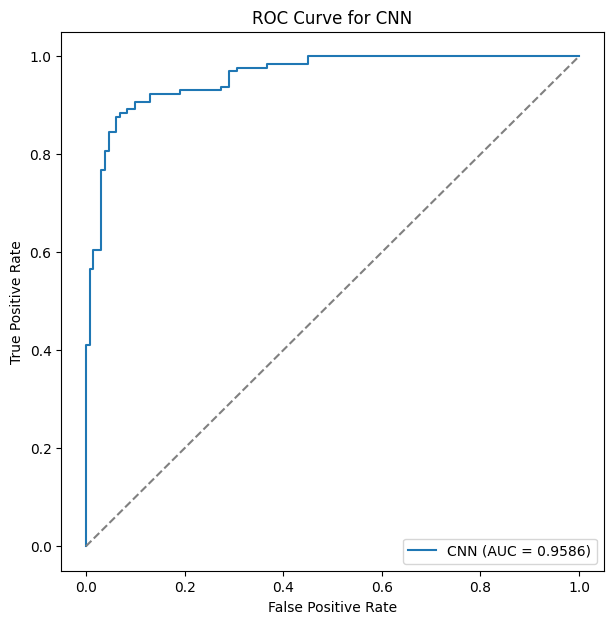

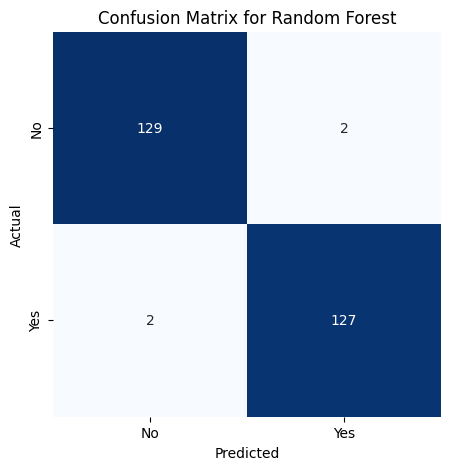

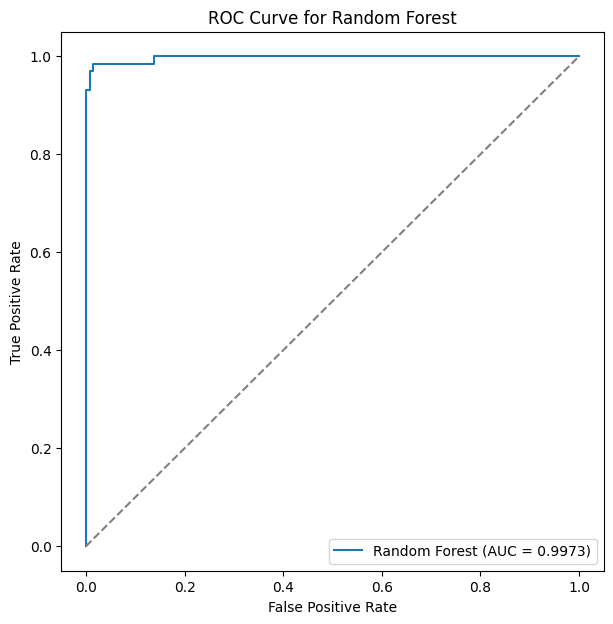

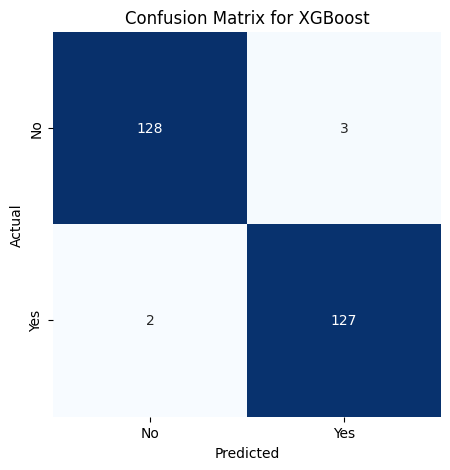

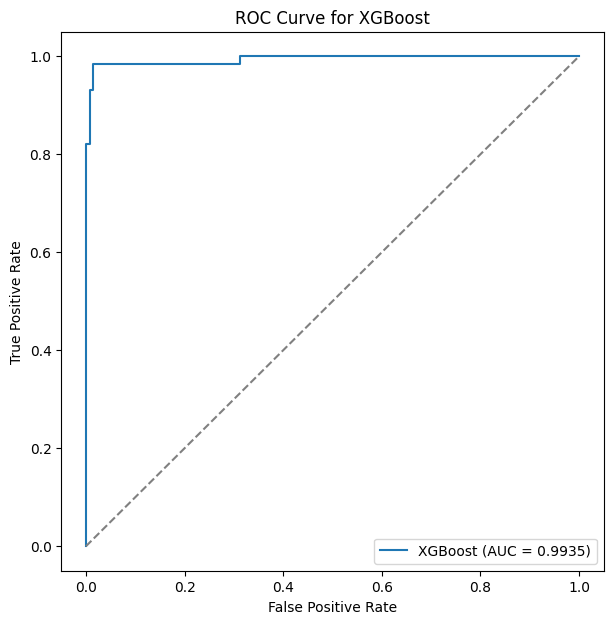

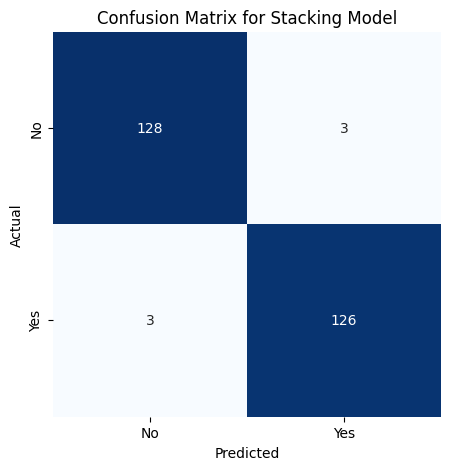

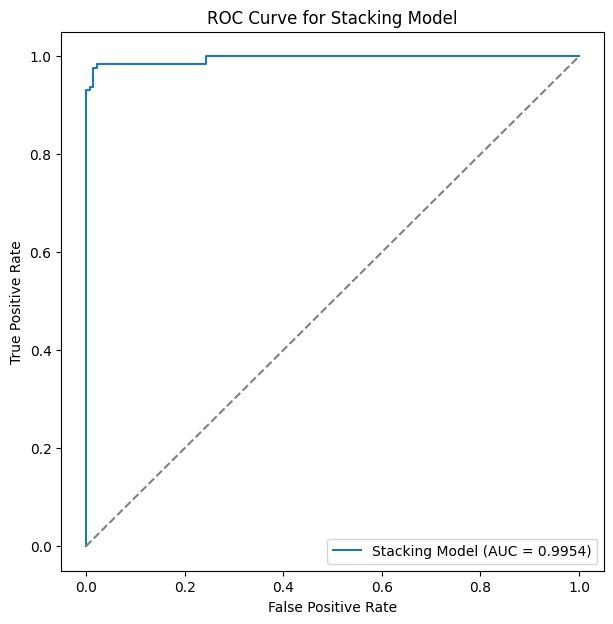

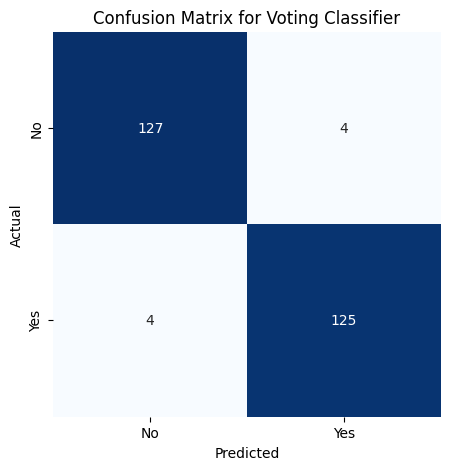

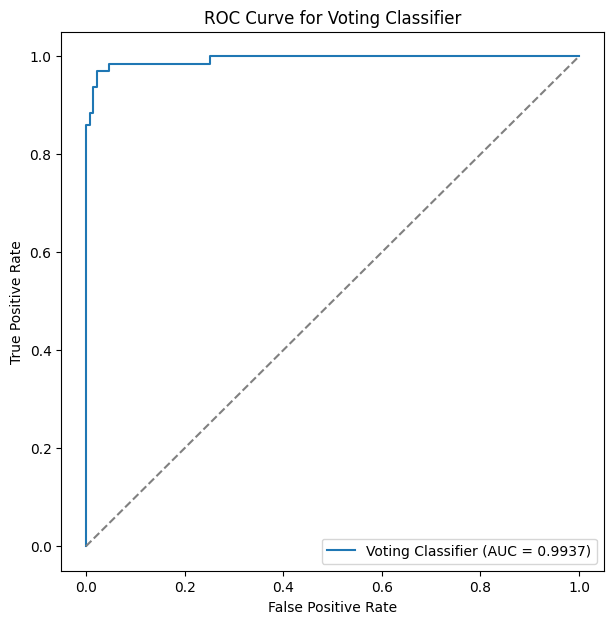


Model Comparison:
               Model  Accuracy       AUC
0                CNN  0.900000  0.958577
1      Random Forest  0.984615  0.997337
2            XGBoost  0.980769  0.993491
3     Stacking Model  0.976923  0.995384
4  Voting Classifier  0.969231  0.993668


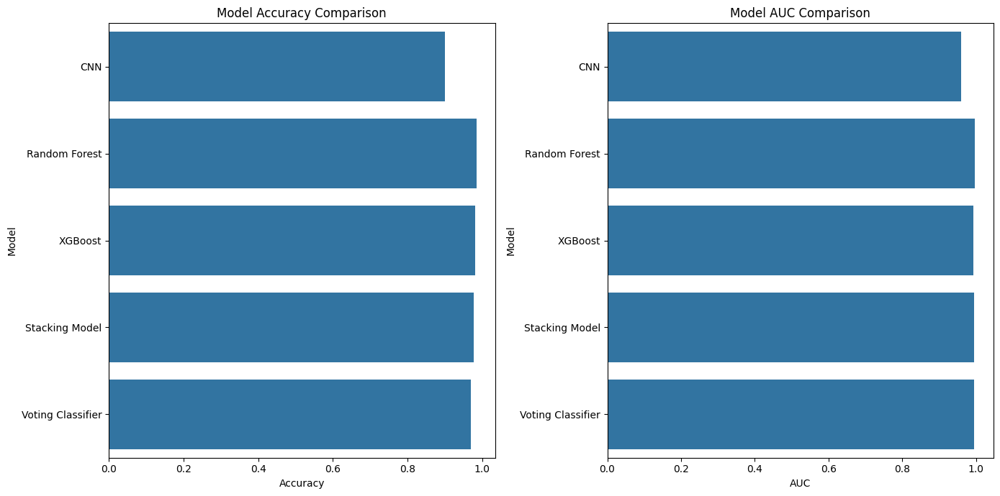

<Figure size 640x480 with 0 Axes>

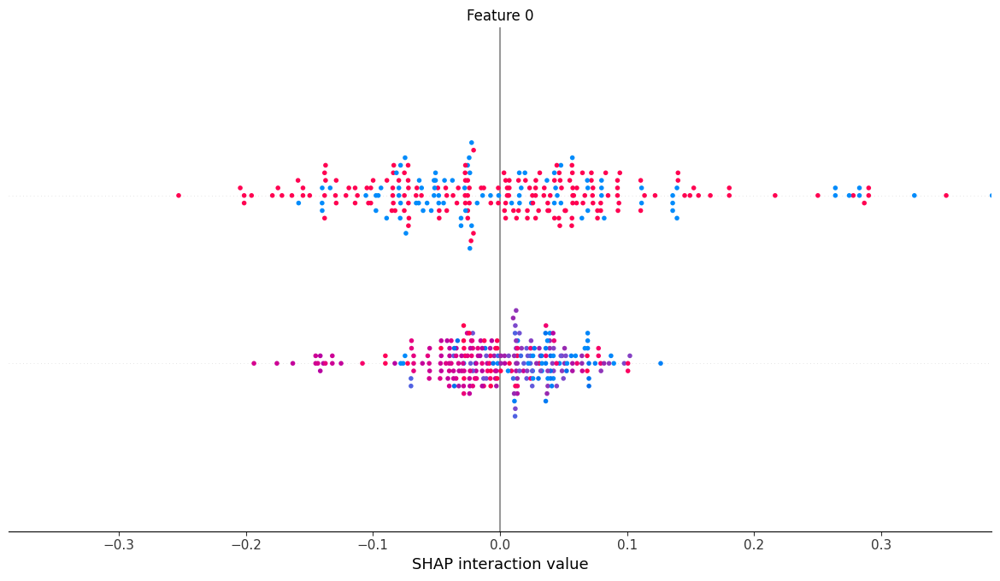

In [38]:
import numpy as np
import pandas as pd
import pickle
import joblib
import matplotlib.pyplot as plt
import seaborn as sns
import shap
import lime
from lime.lime_tabular import LimeTabularExplainer

from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, cross_val_score
from sklearn.metrics import confusion_matrix, roc_auc_score, roc_curve, accuracy_score
from sklearn.ensemble import RandomForestClassifier, StackingClassifier, VotingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest, f_classif
from imblearn.over_sampling import SMOTE
from xgboost import XGBClassifier
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout

# Function to train models, tune hyperparameters, and save models
def train_and_evaluate_models(X, y):
    # Split the dataset into training and test sets
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Handle imbalanced classes using SMOTE
    smote = SMOTE(random_state=42)
    x_train_smote, y_train_smote = smote.fit_resample(x_train, y_train)

    # Feature Scaling (optional, can be added for certain models like SVM, XGBoost)
    scaler = StandardScaler()
    x_train_scaled = scaler.fit_transform(x_train_smote)
    x_test_scaled = scaler.transform(x_test)

    # Reshape data for CNN (1D Convolution)
    x_train_reshaped = x_train_scaled.reshape(x_train_scaled.shape[0], x_train_scaled.shape[1], 1)
    x_test_reshaped = x_test_scaled.reshape(x_test_scaled.shape[0], x_test_scaled.shape[1], 1)

    # Model Initialization (CNN Model)
    cnn_model = Sequential()
    cnn_model.add(Conv1D(64, 3, activation='relu', input_shape=(x_train_reshaped.shape[1], 1)))
    cnn_model.add(MaxPooling1D(pool_size=2))
    cnn_model.add(Flatten())
    cnn_model.add(Dense(128, activation='relu'))
    cnn_model.add(Dropout(0.5))
    cnn_model.add(Dense(1, activation='sigmoid'))  # For binary classification

    cnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit CNN model
    cnn_model.fit(x_train_reshaped, y_train_smote, epochs=10, batch_size=32, validation_data=(x_test_reshaped, y_test))

    # Model Initialization for other models (Random Forest, XGBoost, etc.)
    rf = RandomForestClassifier(random_state=42)
    svm = SVC(probability=True, random_state=42)
    knn = KNeighborsClassifier()
    xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss')

    # Define the Stacking Classifier
    base_learners = [('rf', rf), ('svm', svm), ('knn', knn), ('xgb', xgb)]
    stack_model = StackingClassifier(estimators=base_learners, final_estimator=LogisticRegression())

    # Define Voting Classifier with soft voting (for predict_proba support)
    voting_model = VotingClassifier(estimators=base_learners, voting='soft')

    # K-Fold Cross-Validation (5-fold)
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    cross_val_scores = cross_val_score(stack_model, x_train_scaled, y_train_smote, cv=kfold, scoring='accuracy')
    print(f'Cross-Validation Accuracy: {np.mean(cross_val_scores):.4f}')

    # Hyperparameter tuning for Random Forest (example for tuning)
    param_grid_rf = {'n_estimators': [100, 200], 'max_depth': [10, 20, None]}
    grid_rf = GridSearchCV(rf, param_grid_rf, cv=5, scoring='accuracy')
    grid_rf.fit(x_train_scaled, y_train_smote)

    # Hyperparameter tuning for XGBoost
    param_grid_xgb = {'learning_rate': [0.01, 0.1], 'max_depth': [3, 6], 'n_estimators': [100, 200]}
    grid_xgb = GridSearchCV(xgb, param_grid_xgb, cv=5, scoring='accuracy')
    grid_xgb.fit(x_train_scaled, y_train_smote)

    # Training all models
    rf_best = grid_rf.best_estimator_
    xgb_best = grid_xgb.best_estimator_

    # Feature Selection using K-Best
    kbest = SelectKBest(f_classif, k=10)
    x_train_kbest = kbest.fit_transform(x_train_scaled, y_train_smote)
    x_test_kbest = kbest.transform(x_test_scaled)

    # Create empty lists to store results for comparison
    model_names = []
    accuracies = []
    aucs = []

    # Evaluate models
    models = {'CNN': cnn_model, 'Random Forest': rf_best, 'XGBoost': xgb_best, 'Stacking Model': stack_model, 'Voting Classifier': voting_model}
    for name, model in models.items():
        if name == 'CNN':
            y_pred = (model.predict(x_test_reshaped) > 0.5).astype(int)
            y_proba = model.predict(x_test_reshaped)
        else:
            model.fit(x_train_kbest, y_train_smote)
            y_pred = model.predict(x_test_kbest)
            y_proba = model.predict_proba(x_test_kbest)[:, 1]  # Probability for AUC/ROC

        # Calculate accuracy, AUC, and confusion matrix
        acc = accuracy_score(y_test, y_pred)
        auc = roc_auc_score(y_test, y_proba)

        # Append the results to lists for comparison
        model_names.append(name)
        accuracies.append(acc)
        aucs.append(auc)

        # Plot Confusion Matrix
        cm = confusion_matrix(y_test, y_pred)
        plt.figure(figsize=(5,5))
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False, xticklabels=["No", "Yes"], yticklabels=["No", "Yes"])
        plt.title(f'Confusion Matrix for {name}')
        plt.xlabel('Predicted')
        plt.ylabel('Actual')
        plt.show()

        # Plot ROC Curve
        fpr, tpr, thresholds = roc_curve(y_test, y_proba)
        plt.figure(figsize=(7,7))
        plt.plot(fpr, tpr, label=f'{name} (AUC = {auc:.4f})')
        plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'ROC Curve for {name}')
        plt.legend(loc='lower right')
        plt.show()

    # Create a DataFrame for comparison
    comparison_df = pd.DataFrame({
        'Model': model_names,
        'Accuracy': accuracies,
        'AUC': aucs
    })

    # Print the comparison table
    print("\nModel Comparison:")
    print(comparison_df)

    # Plot Comparison (Accuracy and AUC)
    fig, ax = plt.subplots(1, 2, figsize=(14, 7))

    # Accuracy Plot
    sns.barplot(x='Accuracy', y='Model', data=comparison_df, ax=ax[0])
    ax[0].set_title('Model Accuracy Comparison')

    # AUC Plot
    sns.barplot(x='AUC', y='Model', data=comparison_df, ax=ax[1])
    ax[1].set_title('Model AUC Comparison')

    plt.tight_layout()
    plt.show()

    # XAI - SHAP and LIME Explanations

    # SHAP explanation for RandomForest model
    explainer = shap.TreeExplainer(rf_best)
    shap_values = explainer.shap_values(x_test_kbest)
    shap.summary_plot(shap_values, x_test_kbest)

    # LIME explanation for RandomForest model
    lime_explainer = LimeTabularExplainer(x_train_kbest, training_labels=y_train_smote, mode="classification")
    lime_explanation = lime_explainer.explain_instance(x_test_kbest[0], rf_best.predict_proba, num_features=10)
    lime_explanation.show_in_notebook()


train_and_evaluate_models(x, y)


In [68]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import shap
import lime
from lime.lime_tabular import LimeTabularExplainer
import joblib
import os

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, confusion_matrix
from sklearn.ensemble import RandomForestClassifier, StackingClassifier, VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.preprocessing import StandardScaler
from xgboost import XGBClassifier
from imblearn.over_sampling import SMOTE

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout


def plot_confusion_matrix(y_true, y_pred, model_name, save_path):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.title(f'{model_name} Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.savefig(save_path)
    plt.close()


def plot_roc_auc(y_true, y_proba, model_name, save_path):
    fpr, tpr, _ = roc_curve(y_true, y_proba)
    auc_score = roc_auc_score(y_true, y_proba)
    plt.figure(figsize=(6, 5))
    plt.plot(fpr, tpr, label=f'AUC = {auc_score:.3f}')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'{model_name} ROC Curve')
    plt.legend(loc='lower right')
    plt.savefig(save_path)
    plt.close()


def train_and_save_models(X, y):
    x_train, x_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42, stratify=y)

    smote = SMOTE(random_state=42)
    x_train_res, y_train_res = smote.fit_resample(x_train, y_train)

    scaler = StandardScaler()
    x_train_scaled = scaler.fit_transform(x_train_res)
    x_test_scaled = scaler.transform(x_test)

    kbest = SelectKBest(score_func=f_classif, k=10)
    x_train_kbest = kbest.fit_transform(x_train_scaled, y_train_res)
    x_test_kbest = kbest.transform(x_test_scaled)

    os.makedirs("saved_models", exist_ok=True)
    os.makedirs("saved_models/plots", exist_ok=True)

    joblib.dump(scaler, "saved_models/scaler.joblib")
    joblib.dump(kbest, "saved_models/kbest.joblib")
    joblib.dump(list(X.columns), "saved_models/feature_names.joblib")

    rf = RandomForestClassifier(random_state=42)
    svm = SVC(probability=True, random_state=42)
    knn = KNeighborsClassifier()
    xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss')

    base_learners = [('rf', rf), ('svm', svm), ('knn', knn), ('xgb', xgb)]
    stack_model = StackingClassifier(
        estimators=base_learners, final_estimator=LogisticRegression())
    voting_model = VotingClassifier(estimators=base_learners, voting='soft')

    # CNN model preparation
    x_train_cnn = x_train_scaled.reshape(x_train_scaled.shape[0], x_train_scaled.shape[1], 1)
    x_test_cnn = x_test_scaled.reshape(x_test_scaled.shape[0], x_test_scaled.shape[1], 1)

    cnn = Sequential([
        Conv1D(64, 3, activation='relu', input_shape=(x_train_cnn.shape[1], 1)),
        MaxPooling1D(2),
        Flatten(),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(1, activation='sigmoid')
    ])

    cnn.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    cnn.fit(x_train_cnn, y_train_res, epochs=10, batch_size=32,
            validation_data=(x_test_cnn, y_test))

    models = {
        'Random Forest': rf,
        'SVM': svm,
        'KNN': knn,
        'XGBoost': xgb,
        'Stacking Model': stack_model,
        'Voting Classifier': voting_model
    }

    model_metrics = []

    # Train traditional ML models on selected features
    for name, model in models.items():
        model.fit(x_train_kbest, y_train_res)

        # Save model
        joblib.dump(model, f"saved_models/{name}.joblib")

        # Predict on test set
        y_pred = model.predict(x_test_kbest)
        y_proba = None
        if hasattr(model, "predict_proba"):
            y_proba = model.predict_proba(x_test_kbest)[:, 1]
        elif hasattr(model, "decision_function"):
            decision_scores = model.decision_function(x_test_kbest)
            y_proba = 1 / (1 + np.exp(-decision_scores))

        # Plot confusion matrix and ROC/AUC
        plot_confusion_matrix(
            y_test, y_pred, name, f"saved_models/plots/{name}_confusion_matrix.png")
        if y_proba is not None:
            plot_roc_auc(
                y_test, y_proba, name, f"saved_models/plots/{name}_roc_auc.png")

        acc = accuracy_score(y_test, y_pred)
        auc = roc_auc_score(y_test, y_proba) if y_proba is not None else np.nan
        model_metrics.append({'Model': name, 'Accuracy': acc, 'AUC': auc})

        print(f"{name} - Accuracy: {acc:.4f}, AUC: {auc:.4f}")

    # CNN evaluation
    cnn_eval = cnn.evaluate(x_test_cnn, y_test, verbose=0)
    cnn_probs = cnn.predict(x_test_cnn).ravel()
    cnn_preds = (cnn_probs > 0.5).astype(int)

    plot_confusion_matrix(
        y_test, cnn_preds, "CNN", "saved_models/plots/CNN_confusion_matrix.png")
    plot_roc_auc(
        y_test, cnn_probs, "CNN", "saved_models/plots/CNN_roc_auc.png")
    cnn.save("saved_models/CNN.h5")
    joblib.dump(cnn, "saved_models/CNN_model.pkl")

    print(f"CNN - Loss: {cnn_eval[0]:.4f}, Accuracy: {cnn_eval[1]:.4f}")
    model_metrics.append(
        {'Model': 'CNN', 'Accuracy': cnn_eval[1], 'AUC': roc_auc_score(y_test, cnn_probs)})

    # --- Comparison Plot ---
    metrics_df = pd.DataFrame(model_metrics)

    plt.figure(figsize=(10, 6))
    width = 0.35
    x = np.arange(len(metrics_df['Model']))

    plt.bar(x - width/2, metrics_df['Accuracy'], width, label='Accuracy')
    plt.bar(x + width/2, metrics_df['AUC'], width, label='AUC')

    plt.xticks(x, metrics_df['Model'], rotation=45, ha='right')
    plt.ylabel('Score')
    plt.ylim(0, 1.05)
    plt.title('Model Performance Comparison: Accuracy vs AUC')
    plt.legend()
    plt.tight_layout()
    plt.savefig("saved_models/plots/model_comparison.png")
    plt.close()

    print("✅ Model comparison plot saved as 'saved_models/plots/model_comparison.png'")

    # === Explainability (XAI) ===
    feature_names = kbest.get_feature_names_out(list(X.columns))
    print("\n🔍 Generating XAI explanations...")

    # SHAP for tree-based models
    explainer_rf = shap.TreeExplainer(rf)
    shap_values_rf = explainer_rf.shap_values(x_test_kbest)

    plt.title("SHAP Summary Plot - Random Forest")
    shap.summary_plot(shap_values_rf, x_test_kbest,
                      feature_names=feature_names, show=False)
    plt.savefig("saved_models/plots/shap_summary_rf.png")
    plt.close()

    explainer_xgb = shap.TreeExplainer(xgb)
    shap_values_xgb = explainer_xgb.shap_values(x_test_kbest)

    plt.title("SHAP Summary Plot - XGBoost")
    shap.summary_plot(shap_values_xgb, x_test_kbest,
                      feature_names=feature_names, show=False)
    plt.savefig("saved_models/plots/shap_summary_xgb.png")
    plt.close()

    # LIME for Voting Classifier on a random test instance
    explainer_lime = LimeTabularExplainer(
        training_data=x_train_kbest,
        feature_names=feature_names,
        class_names=['No Disease', 'Disease'],
        mode='classification'
    )

    idx = np.random.randint(0, x_test_kbest.shape[0])
    exp = explainer_lime.explain_instance(
        data_row=x_test_kbest[idx],
        predict_fn=voting_model.predict_proba
    )
    print(f"\nLIME explanation for Voting Classifier on test instance index {idx}:\n")
    print(exp.as_list())

    # Save LIME explanation to HTML
    exp.save_to_file('saved_models/plots/lime_voting_explanation.html')

    print("\n✅ XAI explanations saved.")

    # === Example: Single Patient Prediction Using Voting Classifier ===
    print("\n🧪 Single Patient Prediction Using Voting Classifier")

    example_idx = 0
    example_patient = x_test_kbest[example_idx].reshape(1, -1)
    pred_prob = voting_model.predict_proba(example_patient)[0][1]
    pred_class = voting_model.predict(example_patient)[0]

    print(f"Prediction Probability (Disease): {pred_prob:.4f}")
    print(f"Predicted Class: {pred_class}")




train_and_save_models(x, y)


Epoch 1/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.6955 - loss: 0.5827 - val_accuracy: 0.8269 - val_loss: 0.4347
Epoch 2/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8187 - loss: 0.4059 - val_accuracy: 0.8154 - val_loss: 0.4130
Epoch 3/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8191 - loss: 0.3956 - val_accuracy: 0.8269 - val_loss: 0.3885
Epoch 4/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8327 - loss: 0.3649 - val_accuracy: 0.8346 - val_loss: 0.3818
Epoch 5/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8448 - loss: 0.3508 - val_accuracy: 0.8462 - val_loss: 0.3484
Epoch 6/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8658 - loss: 0.3080 - val_accuracy: 0.8615 - val_loss: 0.3350
Epoch 7/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8761 - loss: 0.2901 - val_accuracy: 0.8731 - val_loss: 0.3164
Epoch 8/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8733 - loss: 0.2989 - val_accuracy: 0.8577 - val_loss:

CNN - Loss: 0.2851, Accuracy: 0.9038
✅ Model comparison plot saved as 'saved_models/plots/model_comparison.png'

🔍 Generating XAI explanations...

LIME explanation for Voting Classifier on test instance index 61:

[('ca <= -0.76', -0.18156773643776453), ('cp <= -0.20', -0.14067243853163064), ('thal <= -0.94', -0.10637841513952154), ('-1.53 < sex <= 0.65', 0.04582776131855653), ('0.19 < age <= 0.76', 0.042426193271841724), ('slope <= -1.01', -0.028831955356932126), ('restecg <= -1.01', -0.02786356865459914), ('0.13 < thalach <= 0.70', -0.02193434874924892), ('-0.29 < oldpeak <= 0.63', -0.019848863993228), ('exang <= -0.65', -0.00811265346447391)]

✅ XAI explanations saved.

🧪 Single Patient Prediction Using Voting Classifier
Prediction Probability (Disease): 0.9960
Predicted Class: 1


In [64]:
single_input = {
    'age': 28,
    'chol': 145,
    'thalach': 180,
    'cp': 2,
    'exang': 0,
    'oldpeak': 0.0,
    'sex': 0,          # Female
    'fbs': 0,
    'restecg': 0,
    'slope': 2,
    'ca': 0,
    'thal': 2,
    'trestbps': 110
}
feature_names = joblib.load("saved_models/feature_names.joblib")
input_df = pd.DataFrame([[single_input[feat] for feat in feature_names]], columns=feature_names)

scaler = joblib.load("saved_models/scaler.joblib")
kbest = joblib.load("saved_models/kbest.joblib")
model = joblib.load("saved_models/Voting Classifier.joblib")

input_scaled = scaler.transform(input_df)
input_kbest = kbest.transform(input_scaled)

prediction = model.predict(input_kbest)
proba = model.predict_proba(input_kbest)

print(f"\n🧠 Prediction: {'Heart Disease' if prediction[0] == 1 else 'No Heart Disease'}")
print(f"🫀 Probability of No Heart Disease: {proba[0][0]:.4f}")
print(f"❤️ Probability of Heart Disease: {proba[0][1]:.4f}")


🧠 Prediction: No Heart Disease
🫀 Probability of No Heart Disease: 0.8211
❤️ Probability of Heart Disease: 0.1789
